In [1]:
import os
import sys
import numpy as np
from sklearn.decomposition import PCA


sys.path.insert(1, os.getenv("MOMAPS_HOME"))
from src.common.lib.utils import load_config_file
from src.datasets.dataset_spd import DatasetSPD
from src.common.lib.embeddings_utils import load_embeddings
import src.common.lib.synthetic_multiplexing as synthetic_multiplexing

from matplotlib import cm
import matplotlib.pyplot as plt

from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc, RocCurveDisplay, \
    balanced_accuracy_score, roc_auc_score, classification_report, confusion_matrix, multilabel_confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
import matplotlib
from collections import defaultdict, Counter

from sklearn.preprocessing import label_binarize

from sklearn.base import clone

%matplotlib inline
%load_ext autoreload 
%autoreload 2





/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinla

MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


# utils

In [2]:
def fit_and_plot_multiclass_cv_auc_roc_curves(estimator, cv_k_fold, X, y, n_classes,
                                              class_names, colors, sample_weight=None, title="", minimal_legend=False):
    """
    For every class, plot a curve per fold.
    A total of (n_classes * n_folds) AUC ROC curves are presented in the plot
    :param estimator:
    :param cv_k_fold:
    :param X:
    :param y:
    :param n_classes:
    :param title:
    :return:
    """

    tprs, aucs = [], []
    mean_fpr = np.linspace(0, 1, 100)
    _tpr, _fpr, _roc_auc = dict(), dict(), dict()
    _roc_auc2 = defaultdict(list)
    fig, ax = plt.subplots(figsize=(5, 5))
    

    for i, (train_fold, test_fold) in enumerate(cv_k_fold.split(X, y)):
        estimator_copy = clone(estimator)
        # -------- -------- -------- -------- -------- --------
        # Train a model on the train set
        estimator_copy.fit(X[train_fold], y[train_fold])
        # Get the true labels (classes)
        # Binarize labels in a one-vs-all fashion
        y_true = label_binarize(y[test_fold], classes=class_names)
        # -------- -------- -------- -------- -------- --------
        # Validate on test set
        y_proba = estimator_copy.predict_proba(X[test_fold])
        # -------- -------- -------- -------- -------- --------
        # For every class, plot a curve per fold (n_class * n_folds)
        for j, class_color, class_name in zip(range(n_classes), colors, class_names):

            # calculate AUC ROC - generate TPR and FPR curves
            _fpr[j], _tpr[j], _ = roc_curve(y_true[:, j],
                                          y_proba[:, j],
                                          #sample_weight=sample_weight,
                                          drop_intermediate=True)

            _roc_auc[j] = auc(_fpr[j], _tpr[j])
            _roc_auc2[class_name].append(_roc_auc[j])

            viz = RocCurveDisplay(fpr=_fpr[j], tpr=_tpr[j], roc_auc=_roc_auc[j], estimator_name=class_name)
            # Set a legend for each fold and each class
            viz.plot(ax=ax, name=class_name + ' fold {}'.format(i + 1), alpha=0.8, lw=1.8, linestyle=':',
                         color=class_color)

            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)
        # -------- -------- -------- -------- -------- --------

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='dimgray', label='Chance', alpha=.5)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='black',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=1.0)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.01, 1.05], ylim=[-0.01, 1.05])

    plt.title(title, color='black', fontsize=20)
    plt.xlabel('False Positive Rate (%)', fontsize=20, color='black')
    plt.ylabel('True Positive Rate (%)', fontsize=20, color='black')

    ax.legend(loc="lower right", prop={"size": 14}, bbox_to_anchor=(1.5, 1.5))

    plt.show()
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_training.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()
    return np.asarray(aucs)

def plot_conf_matrix(clf, X_test, y_test, normalize='true'):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(clf.classes_)
    print(unique_labels)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_true=y_test, y_pred=predictions, labels=unique_labels, normalize=normalize)

    import seaborn as sns

    if normalize is None:
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    else:
        sns.heatmap(conf_matrix, annot=True, fmt='.2%', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()

def validate_classifier(model, X, y, default_model_scorer, class_names, colors, sample_weight=None, title='', show_plot=False):
    """
    Perform full evaluation for a multi-class classifier on a given X and y

    :param model: sklearn Estimator (classifier)
    :param X: features matrix in a numpy matrix
    :param y: true labels in a numpy array (multi-class)
    :param default_model_scorer: string, sklearn.metric
    :param class_names: list of strings
    :param sample_weight: list of real numbers
    :param title: text
    :param show_plot: Boolean
    :return:

    """

    print("Validating - " + str(title) + "\n\n------------------")

    # -------- -------- -------- -------- -------- --------
    # Infer the probabilities for every class
    y_pred_prob = model.predict_proba(X)

    # Infer binary label to be used in classification_report()
    # by default, samples are classified to whichever class has the greatest probability (max)
    # y_pred_label = np.argmax(y_pred_prob, axis=1)  # nancy test
    y_pred = model.predict(X)
    # -------- -------- -------- -------- -------- --------

    print("\nBalanced accuracy score: " + str(balanced_accuracy_score(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                            adjusted=False)) + ". \nBalanced accuracy score (adjusted): " + str(balanced_accuracy_score(y_true=y,
                                                                                                                        y_pred=y_pred,
                                                                                                                        #sample_weight=sample_weight,
                            adjusted=True)))
    # -------- -------- -------- -------- -------- --------
    macro_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                      average="macro")
    weighted_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                         average="weighted")

    macro_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                      average="macro" #, sample_weight=sample_weight
                                      )
    weighted_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                         average="weighted" #, sample_weight=sample_weight
    )
    print("\n\nOne-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
    print("\n\nOne-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))
    # -------- -------- -------- -------- -------- --------
    # ROC AUC curves for each class (one-vs-rest)
    _roc_auc_scores = plot_multiclass_area_under_curves(y_true=y, y_proba=y_pred_prob, n_classes=len(class_names),
                                                        class_names=class_names, colors=colors)#, sample_weight=sample_weight)

    print("\nHELDOUT SET - AUC ROC scores of each class: " + str(_roc_auc_scores))
    # -------- -------- -------- -------- -------- --------
    print("'nHELDOUT SET - Classification Report: \n" + str(
        classification_report(y_true=y, y_pred=y_pred, target_names=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    print("HELDOUT SET - Multilabel Confusion Matrix: \n" + str(
        multilabel_confusion_matrix(y_true=y, y_pred=y_pred, labels=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    matplotlib.rcParams.update({'font.size': 8})
    plot_conf_matrix(model, X, y)
    # fig = plt.figure(figsize=(4, 4))
    # conf_mat = multilabel_confusion_matrix(y, y_pred)
    # ConfusionMatrixDisplay(conf_mat, display_labels=class_names)
    # plt.title('Confusion matrix "one vs. rest"', fontsize=20, color='black')
    # plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'ovr_confusion_matrix_all_classes_heldout.png'),bbox_inches='tight',dpi=1200)
    plt.close()
    # -------- -------- -------- -------- -------- --------
    cnf_matrix = confusion_matrix(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                                  labels=class_names)
    print("\nHELDOUT SET - One-vs-rest Confusion Matrix:\n" + str(cnf_matrix))

    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
    TP = np.diag(cnf_matrix)
    TN = cnf_matrix.sum() - (FP + FN + TP)

    FP = FP.astype(float)
    FN = FN.astype(float)
    TP = TP.astype(float)
    TN = TN.astype(float)

    TPR = TP / (TP + FN)
    print("Sensitivity, hit rate, recall, or true positive rate: " + str(TPR))

    TNR = TN / (TN + FP)
    print("Specificity or true negative rate: " + str(TNR))

    PPV = TP / (TP + FP)
    print("Precision or positive predictive value: " + str(PPV))

    NPV = TN / (TN + FN)
    print("Negative predictive value: " + str(NPV))

    FPR = FP / (FP + TN)
    print("Fall out or false positive rate: " + str(FPR))

    FNR = FN / (TP + FN)
    print("False negative rate: " + str(FNR))

    FDR = FP / (TP + FP)
    print("False discovery rate: " + str(FDR))

    ACC = (TP + TN) / (TP + FP + FN + TN)
    print("Overall accuracy: " + str(ACC))

    # -------- -------- -------- -------- -------- --------
    test_score = model.score(X, y)#, sample_weight=sample_weight)

    print(
        "Performance score " + str(default_model_scorer) + " on the held-out test-set (25%): " + str(test_score))

    return test_score




def plot_multiclass_area_under_curves(y_true, y_proba, n_classes, class_names, colors):#, sample_weight):
    """
    Study the output of a multi-class classifier.
    One curve can be drawn per class/label and consider precision-recall and roc curves for each class.

    Note: it is necessary to binarize y_true, and y_proba should be class probabilities (using "predict_proba()").

    :param y_true: numpy
    :param y_proba: numpy
    :param n_classes: int

    :return: roc_auc
    """

    # Binarize labels in a one-vs-all fashion
    y = label_binarize(y_true, classes=class_names)

    # ROC curve
    tpr, fpr = dict(), dict()

    # ROC score
    roc_auc = dict()

    # precision recall curve
    precision = dict()
    recall = dict()
    # precision score
    precision_score = dict()

    # colors = cycle(['deepskyblue', 'orangered', 'seagreen'])
    fig = plt.figure(figsize=(5, 5))

    for i in range(n_classes):
        # calculate AUC ROC - generate TPR and FPR curves
        fpr[i], tpr[i], _ = roc_curve(y[:, i], y_proba[:, i])#, sample_weight=sample_weight)
        roc_auc[i] = auc(fpr[i], tpr[i])
        # calculate precision-recall
        precision[i], recall[i], _ = precision_recall_curve(y_true=y[:, i], probas_pred=y_proba[:, i])#,sample_weight=sample_weight)
        precision_score[i] = average_precision_score(y_true=y[:, i], y_score=y_proba[:, i], average="weighted")

    # ----------------------------------------------------------------
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y.ravel(), y_proba.ravel())#, sample_weight=sample_weight)
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # ----------------------------------------------------------------
    # aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------------------------------------
    # Draw ROC curves for all classes
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='{0} (AUC = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_heldout.png'), bbox_inches='tight', dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Draw Precision-Recall curves
    fig = plt.figure(figsize=(5, 5))
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(recall[i], precision[i], color=color, lw=1.4, label=' {0} (weighted avg. precision = {1:0.2f})'
                                                                     ''.format(name, precision_score[i]))

    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel("Recall", fontsize=20)
    plt.ylabel("Precision", fontsize=20)

    plt.legend(loc="best", prop={'size': 14})
    plt.suptitle("Precision-Recall curves in held-out data", fontsize=20, color='black')
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'precision_recall_curves_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Plot all ROC curves (EXTENDED PLOT..)
    # ----------------------------------------------------------------
    fig = plt.figure(figsize=(5, 5))

    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=1.4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=1.4)

    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    ax1 = fig.gca()
    ax1.tick_params(axis='both', which='major', labelsize=14)

    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})

    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'extension_AUC_ROC_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    return roc_auc

def val_classifier(clf, X, y, unique_labels):
    validate_classifier(clf, X, y, 'roc_auc_ovr_weighted',
                        unique_labels, sample_weight=None, colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                        title='Validate classifier', show_plot=True)

def fit_eval(clf, X, y, cv=5, random_state=1):
    from sklearn.model_selection import train_test_split, StratifiedKFold
    
    clf_clone = clone(clf)
    
    y = y.reshape(-1,)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, stratify=y, random_state=random_state, shuffle=True)
    print(f"X_train shape {X_train.shape}, X_test shape: {X_test.shape}, y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")
    
    unique_labels = np.unique(y)

    skf = StratifiedKFold(n_splits=cv, random_state=random_state, shuffle=True)
    result = fit_and_plot_multiclass_cv_auc_roc_curves(clf_clone, skf, X_train, y_train,
                                                        n_classes=len(unique_labels),
                                                        class_names=unique_labels,
                                                        colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                                                        title='ROC multi-class one-vs-rest in training')

    print("\n\nTraining dataset (80%): K-Fold Cross Validation score: " + str(model_scorer) + " " + str(
        result) + " Mean: " + str(result.mean()))
    

    clf_clone = clone(clf)
    clf_clone = clf_clone.fit(X_train, y_train)
    val_classifier(clf_clone, X_test, y_test, unique_labels)
    



# Configs

In [3]:
config_path_model = "./src/models/neuroself/configs/model_config/TLNeuroselfB78NoDSModelConfig"
config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsB5DatasetConfig"

In [4]:
model_scorer = 'roc_auc_ovr_weighted'

# Load data

In [86]:
config_model = load_config_file(config_path_model, 'model')
config_data = load_config_file(config_path_data, 'data', config_model.CONFIGS_USED_FOLDER)

In [87]:
config_data.SAMPLE_PCT

1

In [88]:
config_data.INPUT_FOLDERS

['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch5_16bit_no_downsample']

In [89]:
config_data.EMBEDDINGS_LAYER

'vqvec1'

In [90]:
embeddings, labels = load_embeddings(embeddings_type='all', config_model=config_model, config_data=config_data)

2023-08-31 12:00:02 INFO [load_embeddings] Model: preloaded                    Dataset: preloaded,                        embeddings_type: all
2023-08-31 12:00:02 INFO [load_embeddings] experiment_type = neurons
2023-08-31 12:00:02 INFO [load_embeddings] embeddings_layer = vqvec1
2023-08-31 12:00:02 INFO Input folder: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings/neurons/vqvec1/batch5_16bit_no_downsample, depth used: 4
2023-08-31 12:00:02 INFO Running in parallel: 52 processes


2023-08-31 12:04:18 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_Phalloidin of shape (53, 64, 25, 25) 
2023-08-31 12:04:18 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_FUS of shape (46, 64, 25, 25) 
2023-08-31 12:04:19 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_TDP43 of shape (101, 64, 25, 25) 
2023-08-31 12:04:19 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_KIF5A of shape (90, 64, 25, 25) 
2023-08-31 12:04:19 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_Calreticulin of shape (80, 64, 25, 25) 
2023-08-31 12:04:20 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_NCL of shape (105, 64, 25, 25) 
2023-08-31 12:04:20 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_ANXA11 o

In [91]:
embeddings_raw = embeddings.copy()

In [92]:
embeddings_raw.shape

(249378, 64, 25, 25)

---

# Multiplex

In [93]:
print(embeddings.shape)

(249378, 64, 25, 25)


In [94]:

df = synthetic_multiplexing.__embeddings_to_df(embeddings, labels.reshape(-1,), dataset_conf=config_data)
embeddings, y, unique_groups = synthetic_multiplexing.__get_multiplexed_embeddings(df, random_state=config_data.SEED)


2023-08-31 12:08:23 INFO [SM] Common markers: {'CLTC', 'NCL', 'TOMM20', 'TDP43', 'SCNA', 'ANXA11', 'DCP1A', 'GM130', 'FMRP', 'KIF5A', 'PSD95', 'TIA1', 'Phalloidin', 'NEMO', 'G3BP1', 'Calreticulin', 'PURA', 'PEX14', 'SQSTM1', 'LAMP1', 'FUS', 'PML', 'mitotracker', 'NONO', 'CD41'}
2023-08-31 12:08:23 INFO Pheno: FUSHeterozygous_Untreated
2023-08-31 12:08:23 INFO Detected 151 subgroups
2023-08-31 12:08:23 INFO 1/151
2023-08-31 12:08:23 INFO [1/151] Shape: (6229, 3)
2023-08-31 12:08:23 INFO 2/151
2023-08-31 12:08:23 INFO [2/151] Shape: (6204, 3)
2023-08-31 12:08:23 INFO 3/151
2023-08-31 12:08:23 INFO [3/151] Shape: (6179, 3)
2023-08-31 12:08:23 INFO 4/151
2023-08-31 12:08:23 INFO [4/151] Shape: (6154, 3)
2023-08-31 12:08:23 INFO 5/151
2023-08-31 12:08:23 INFO [5/151] Shape: (6129, 3)
2023-08-31 12:08:23 INFO 6/151
2023-08-31 12:08:23 INFO [6/151] Shape: (6104, 3)
2023-08-31 12:08:23 INFO 7/151
2023-08-31 12:08:23 INFO [7/151] Shape: (6079, 3)
2023-08-31 12:08:23 INFO 8/151
2023-08-31 12:08:

In [95]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b5_vqvec1", embeddings)
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b5_vqvec1", y)

In [4]:
embeddings9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b9_new.npy")
y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b9_new.npy")
embeddings9.shape, y9.shape

((9553, 230400), (9553, 1))

In [5]:
embeddings5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b5.npy")
y5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b5.npy")
embeddings5.shape, y5.shape

((5964, 230400), (5964, 1))

In [96]:
embeddings.shape

(5964, 1000000)

# Dim reduction

In [6]:

from sklearn.manifold import MDS
from umap import UMAP

reducer = UMAP(n_components=100, random_state=1)#, max_iter=10)
# reducer.fit(embeddings.reshape(embeddings.shape[0], -1))
# print(reducer.explained_variance_ratio_)
reducer.fit(embeddings9.reshape(embeddings9.shape[0], -1))


UMAP(n_components=100, random_state=1, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [7]:
X9 = reducer.transform(embeddings9.reshape(embeddings9.shape[0], -1))

X9.shape

(9553, 100)

In [8]:
X5 = reducer.transform(embeddings5.reshape(embeddings5.shape[0], -1))
X5.shape

In [ ]:

# from sklearn.manifold import MDS
# from umap import UMAP

# reducer = UMAP(n_components=100, random_state=1)#, max_iter=10)
# # reducer.fit(embeddings.reshape(embeddings.shape[0], -1))
# # print(reducer.explained_variance_ratio_)
# X = reducer.fit_transform(embeddings.reshape(embeddings.shape[0], -1))
# X.shape

-------- 

#### Save to file

In [98]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b5_vqvec1_umap100", X)
# np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/mul_label_all_all", label_data)

#### Load from file

In [5]:
X9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/projection/train_emb9_n100.npy")
y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_labels_batch9_16bit_no_downsample_vqvec2.npy")
X9.shape, y9.shape

((9553, 100), (9553, 1))

In [6]:
X5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/projection/test_emb5_n100.npy")
y5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_labels_batch5_16bit_no_downsample_vqvec2.npy")
X5.shape, y5.shape

((5964, 100), (5964, 1))

### Models

In [15]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
# mlp.fit(X_train, y_train)

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=10, max_depth=3, random_state=1)
# rfc.fit(X_train, y_train)

### Eval

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Validating - Validate classifier

------------------

Balanced accuracy score: 0.7269830096115036. 
Balanced accuracy score (adjusted): 0.6928558858129417


One-vs-One ROC AUC scores:
0.964767 (macro),
0.965980 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.965658 (macro),
0.968271 (weighted by prevalence)


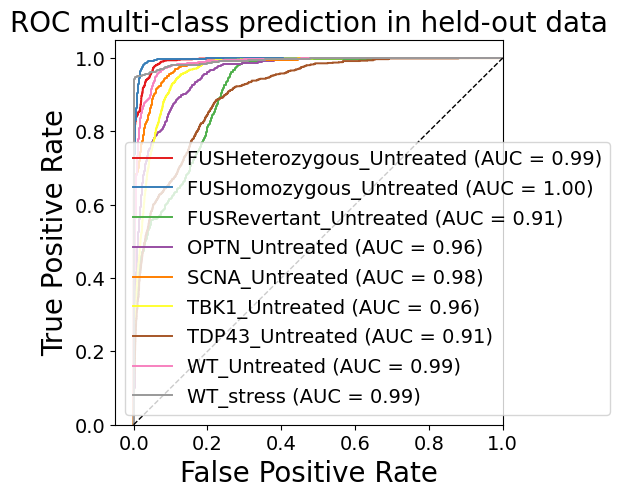

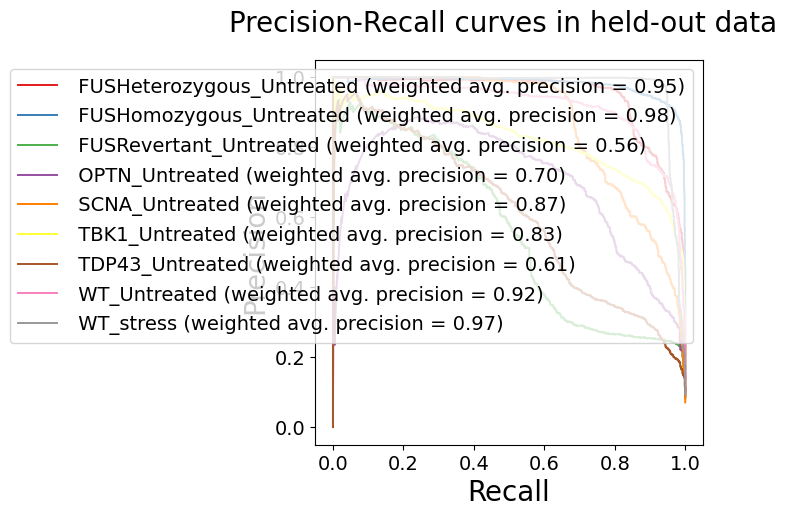

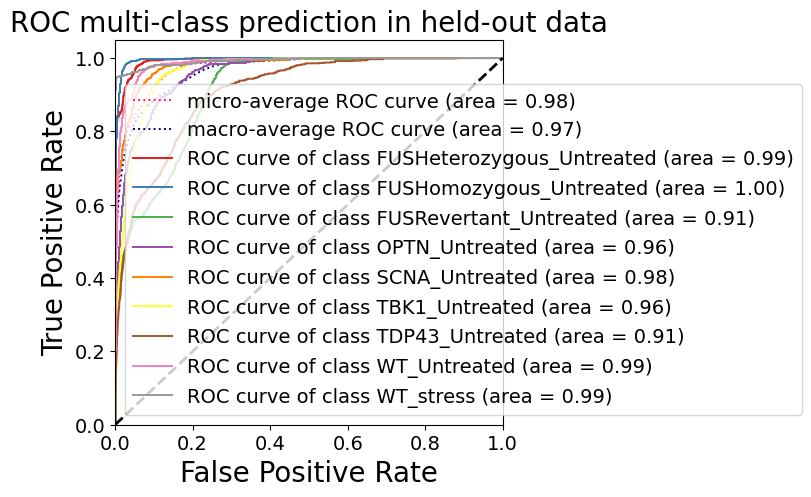


HELDOUT SET - AUC ROC scores of each class: {0: 0.9932841210149989, 1: 0.9962735689321581, 2: 0.9113636046276192, 3: 0.9582889902788465, 4: 0.981108645976152, 5: 0.9644262726810584, 6: 0.9080841269556588, 7: 0.9853134407890973, 8: 0.9927759100073467, 'micro': 0.9751385923621646, 'macro': 0.9657090015542745}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.93      0.83      0.88       818
  FUSHomozygous_Untreated       0.92      0.95      0.94      1606
   FUSRevertant_Untreated       0.79      0.30      0.44       784
           OPTN_Untreated       0.82      0.50      0.62       848
           SCNA_Untreated       0.90      0.68      0.78       678
           TBK1_Untreated       0.56      0.96      0.71      1656
          TDP43_Untreated       0.58      0.56      0.57       975
             WT_Untreated       0.87      0.83      0.85      1290
                WT_stress       0.98      0.93

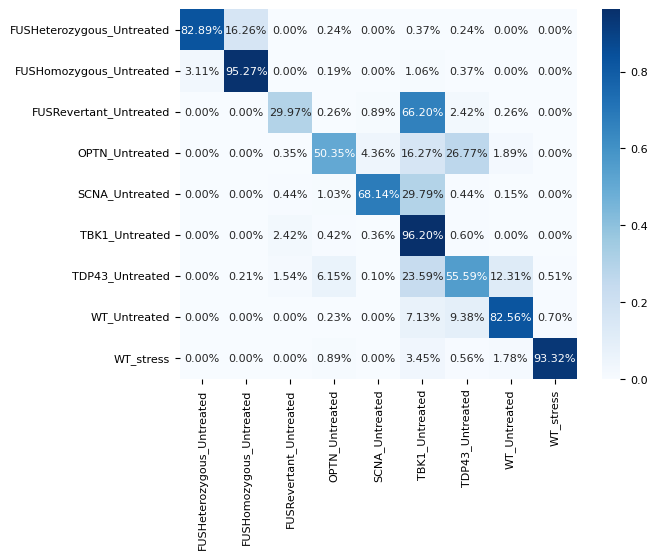


HELDOUT SET - One-vs-rest Confusion Matrix:
[[ 678  133    0    2    0    3    2    0    0]
 [  50 1530    0    3    0   17    6    0    0]
 [   0    0  235    2    7  519   19    2    0]
 [   0    0    3  427   37  138  227   16    0]
 [   0    0    3    7  462  202    3    1    0]
 [   0    0   40    7    6 1593   10    0    0]
 [   0    2   15   60    1  230  542  120    5]
 [   0    0    0    3    0   92  121 1065    9]
 [   0    0    0    8    0   31    5   16  838]]
Sensitivity, hit rate, recall, or true positive rate: [0.82885086 0.95267746 0.2997449  0.50353774 0.68141593 0.96195652
 0.55589744 0.8255814  0.93318486]
Specificity or true negative rate: [0.9942759  0.98301246 0.99304368 0.98943136 0.99425352 0.84399139
 0.95418512 0.98124168 0.99838244]
Precision or positive predictive value: [0.93131868 0.91891892 0.79391892 0.82273603 0.9005848  0.56389381
 0.57967914 0.87295082 0.98356808]
Negative predictive value: [0.98413598 0.99036511 0.94069353 0.95339827 0.97610619 0.99

In [16]:
mlp = mlp.fit(X9, y9)

val_classifier(mlp, X9, y9.reshape(-1,), np.unique(y9.reshape(-1,)))

In [13]:
rfc = rfc.fit(X9, y9)

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Validating - Validate classifier

------------------

Balanced accuracy score: 0.13976298473482424. 
Balanced accuracy score (adjusted): 0.03223335782667727


One-vs-One ROC AUC scores:
0.472182 (macro),
0.488985 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.464785 (macro),
0.524516 (weighted by prevalence)


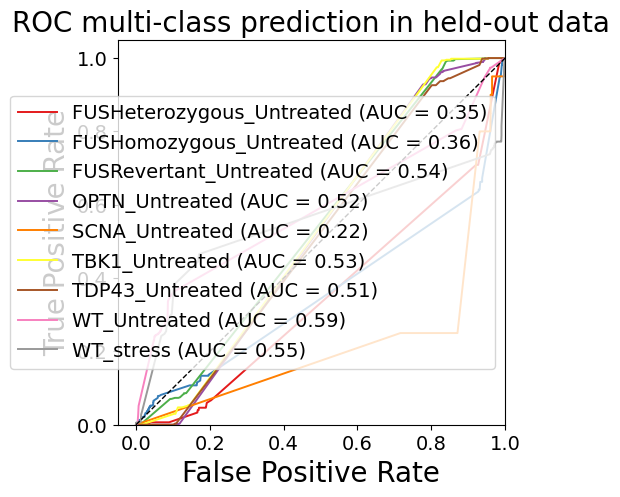

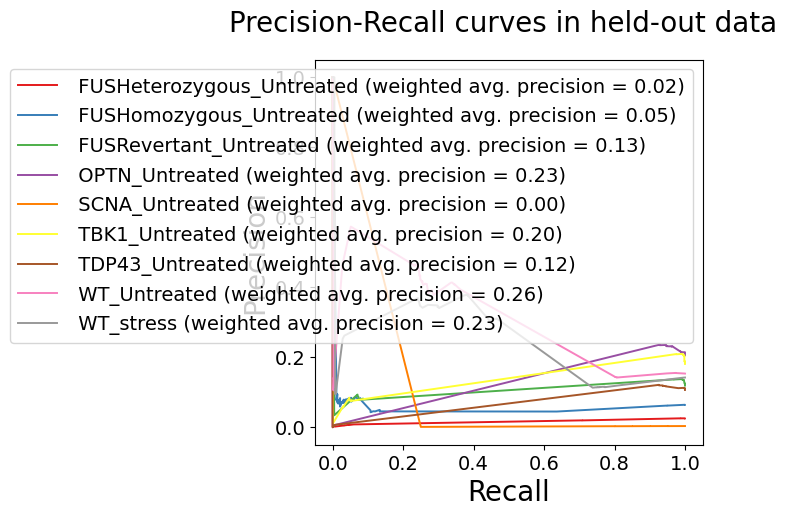

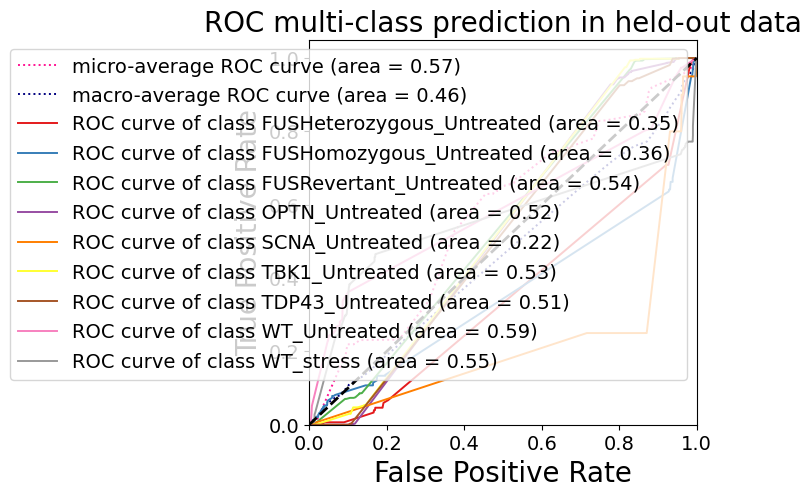


HELDOUT SET - AUC ROC scores of each class: {0: 0.35037931651254384, 1: 0.3581367090554719, 2: 0.5428519920436208, 3: 0.5240377166458821, 4: 0.22067631224764467, 5: 0.5319868561720308, 6: 0.5142890704997022, 7: 0.588393959746084, 8: 0.552312602919315, 'micro': 0.5705900778862758, 'macro': 0.46479095333393694}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00       151
  FUSHomozygous_Untreated       0.08      0.05      0.06       382
   FUSRevertant_Untreated       0.00      0.00      0.00       710
           OPTN_Untreated       0.00      0.00      0.00      1226
           SCNA_Untreated       0.00      0.00      0.00        20
           TBK1_Untreated       0.21      1.00      0.34      1079
          TDP43_Untreated       0.00      0.00      0.00       635
             WT_Untreated       0.44      0.21      0.28       914
                WT_stress       0.57      0.

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

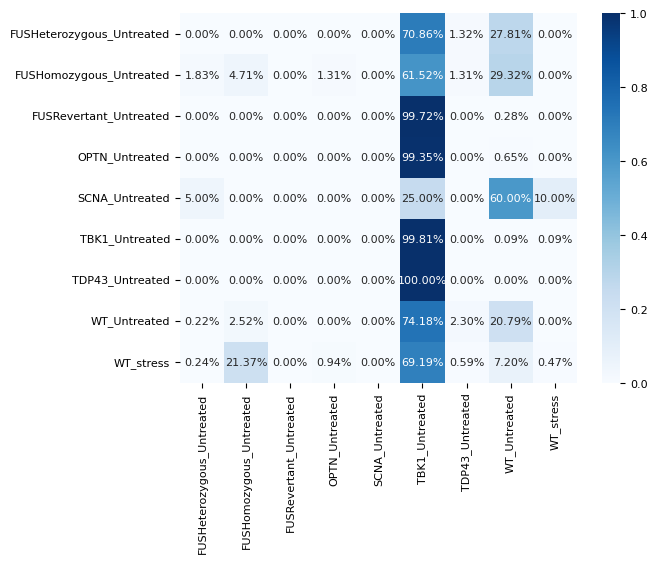


HELDOUT SET - One-vs-rest Confusion Matrix:
[[   0    0    0    0    0  107    2   42    0]
 [   7   18    0    5    0  235    5  112    0]
 [   0    0    0    0    0  708    0    2    0]
 [   0    0    0    0    0 1218    0    8    0]
 [   1    0    0    0    0    5    0   12    2]
 [   0    0    0    0    0 1077    0    1    1]
 [   0    0    0    0    0  635    0    0    0]
 [   2   23    0    0    0  678   21  190    0]
 [   2  181    0    8    0  586    5   61    4]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.04712042 0.         0.         0.         0.99814643
 0.         0.20787746 0.00472255]
Specificity or true negative rate: [0.99793566 0.96345396 1.         0.99725623 1.         0.14595701
 0.99380747 0.95287129 0.99941372]
Precision or positive predictive value: [0.         0.08108108        nan 0.                nan 0.20518194
 0.         0.44392523 0.57142857]
Negative predictive value: [0.97463038 0.93660745 0.88095238 0.7939842  0.99664655 0.99

/tmp/ipykernel_263149/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_263149/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [14]:

val_classifier(rfc, X5, y5.reshape(-1,), np.unique(y5.reshape(-1,)))

Validating - Validate classifier

------------------

Balanced accuracy score: 0.04542849667479684. 
Balanced accuracy score (adjusted): -0.07389294124085355


One-vs-One ROC AUC scores:
0.443977 (macro),
0.458154 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.465627 (macro),
0.476647 (weighted by prevalence)


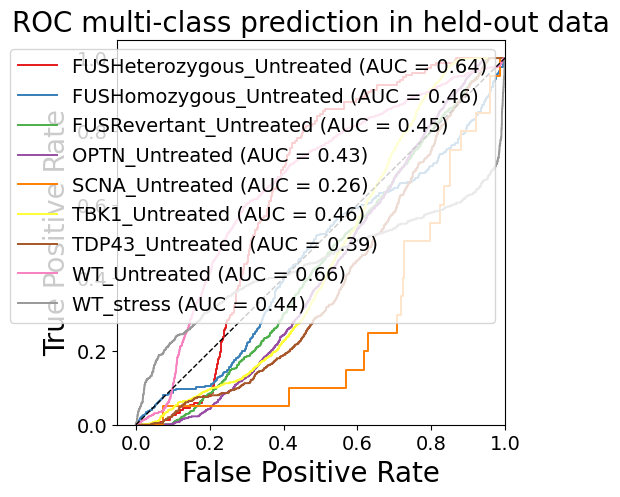

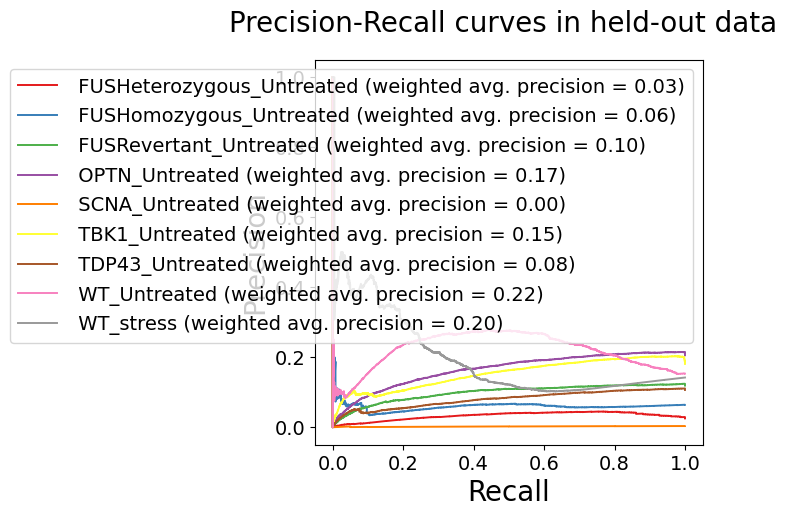

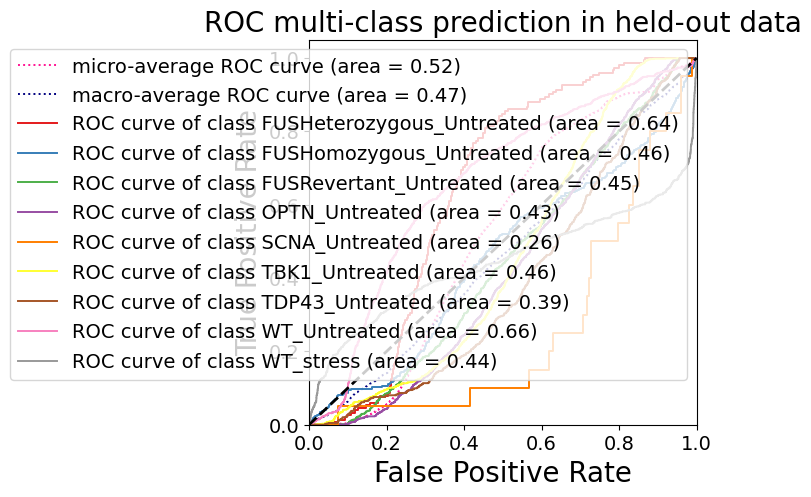


HELDOUT SET - AUC ROC scores of each class: {0: 0.6423624600262258, 1: 0.45687053187039117, 2: 0.445936295351094, 3: 0.4273734038839083, 4: 0.26104475100942126, 5: 0.45893398015335096, 6: 0.39211948290663323, 7: 0.6632064475594167, 8: 0.442796299761496, 'micro': 0.5226397543825438, 'macro': 0.46573209046917974}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00       151
  FUSHomozygous_Untreated       0.07      0.03      0.05       382
   FUSRevertant_Untreated       0.00      0.00      0.00       710
           OPTN_Untreated       0.00      0.00      0.00      1226
           SCNA_Untreated       0.00      0.30      0.00        20
           TBK1_Untreated       0.11      0.06      0.08      1079
          TDP43_Untreated       0.01      0.00      0.00       635
             WT_Untreated       0.21      0.00      0.01       914
                WT_stress       0.67      

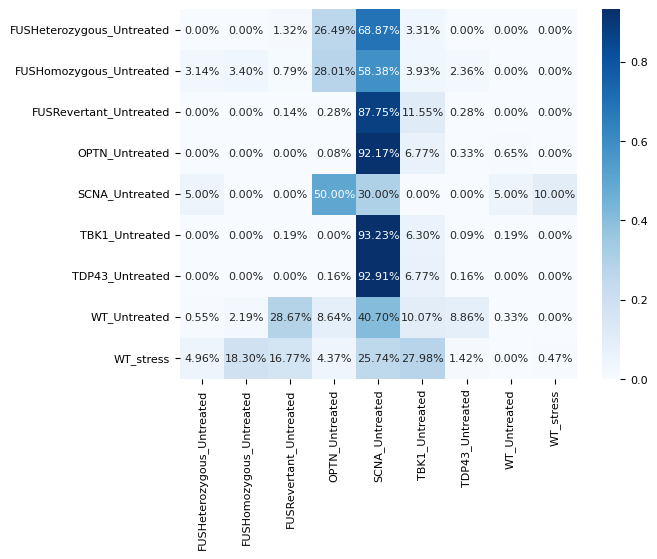


HELDOUT SET - One-vs-rest Confusion Matrix:
[[   0    0    2   40  104    5    0    0    0]
 [  12   13    3  107  223   15    9    0    0]
 [   0    0    1    2  623   82    2    0    0]
 [   0    0    0    1 1130   83    4    8    0]
 [   1    0    0   10    6    0    0    1    2]
 [   0    0    2    0 1006   68    1    2    0]
 [   0    0    0    1  590   43    1    0    0]
 [   5   20  262   79  372   92   81    3    0]
 [  42  155  142   37  218  237   12    0    4]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.03403141 0.00140845 0.00081566 0.3        0.06302132
 0.0015748  0.00328228 0.00472255]
Specificity or true negative rate: [0.98967831 0.96864923 0.92177389 0.94174757 0.28230148 0.88597748
 0.97954588 0.99782178 0.99960915]
Precision or positive predictive value: [0.         0.06914894 0.00242718 0.00361011 0.00140449 0.1088
 0.00909091 0.21428571 0.66666667]
Negative predictive value: [0.97442412 0.93611496 0.87229827 0.78459645 0.99172577 0.810638

In [17]:

val_classifier(mlp, X5, y5.reshape(-1,), np.unique(y5.reshape(-1,)))

### Fit & Eval

#### vqvec1

X_train shape (4771, 100), X_test shape: (1193, 100), y_train shape: (4771,), y_test shape: (1193,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochas

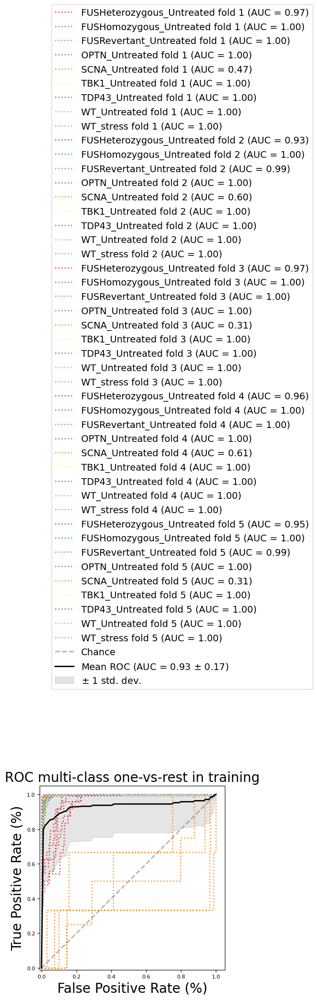



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.96996957 0.99750614 0.99674573 0.9977145  0.47476341 0.99838121
 0.99860929 0.99889937 0.99953026 0.93405018 0.99849467 0.99345238
 0.99952884 0.60287417 0.99939779 0.99897588 0.99961854 0.9977258
 0.96747312 0.99618159 0.99547526 0.99955743 0.30599369 0.9985651
 0.99852711 0.99847416 0.99851683 0.95552207 0.99682411 0.99711679
 0.99907113 0.61128637 0.99871959 0.99757408 0.9996291  0.99980102
 0.94986559 0.9979025  0.98783417 0.99687685 0.30844725 0.99644742
 0.99765533 0.99925403 0.99970153] Mean: 0.9334340210836409


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.7753290827083139. 
Balanced accuracy score (adjusted): 0.7472452180468532


One-vs-One ROC AUC scores:
0.917903 (macro),
0.958972 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.934786 (macro),
0.995578 (weighted by prevalence)


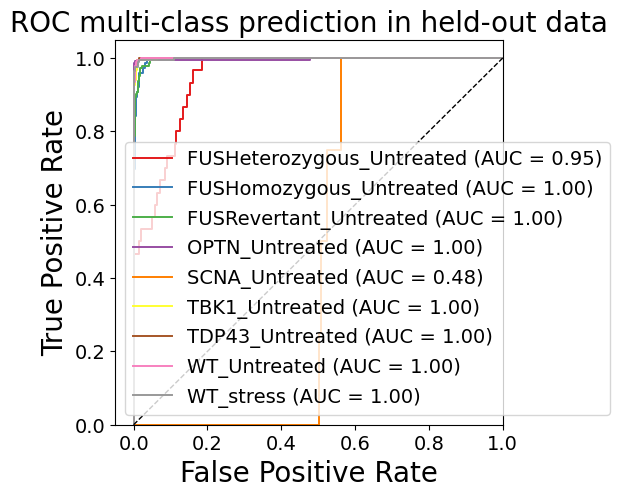

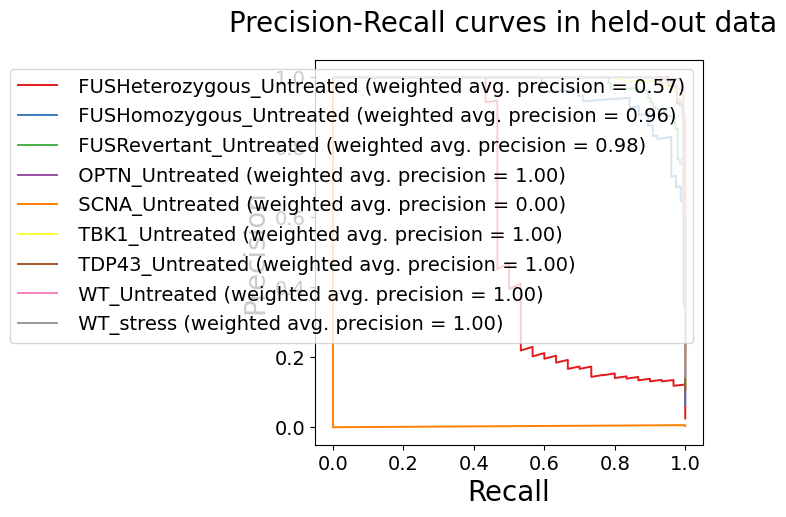

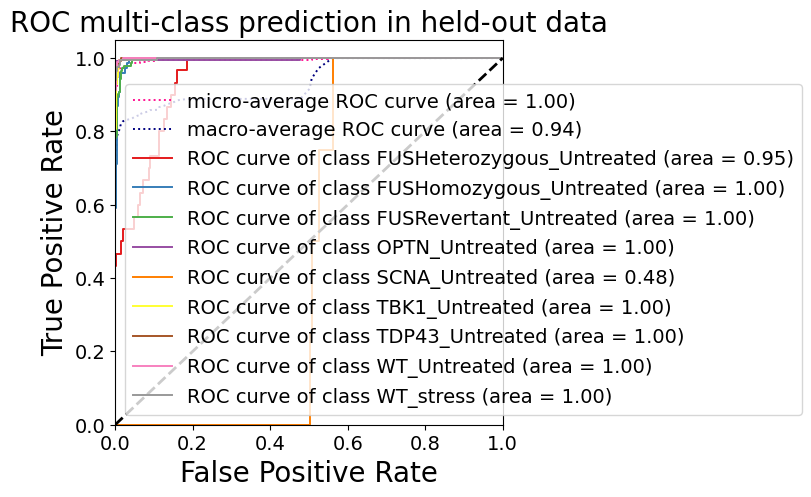


HELDOUT SET - AUC ROC scores of each class: {0: 0.9472055030094584, 1: 0.9969255053479715, 2: 0.9974739014486538, 3: 0.9979247395160595, 4: 0.4762405382674516, 5: 0.998985935782251, 6: 0.9996602207088092, 7: 0.999599632094357, 8: 0.9990569834972112, 'micro': 0.9958893348950183, 'macro': 0.9362727632382822}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       1.00      0.17      0.29        30
  FUSHomozygous_Untreated       0.77      0.99      0.86        76
   FUSRevertant_Untreated       0.92      0.95      0.93       142
           OPTN_Untreated       1.00      0.97      0.98       245
           SCNA_Untreated       0.00      0.00      0.00         4
           TBK1_Untreated       0.96      0.99      0.97       216
          TDP43_Untreated       0.98      0.95      0.97       127
             WT_Untreated       0.95      1.00      0.98       183
                WT_stress       0.99      0.96 

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

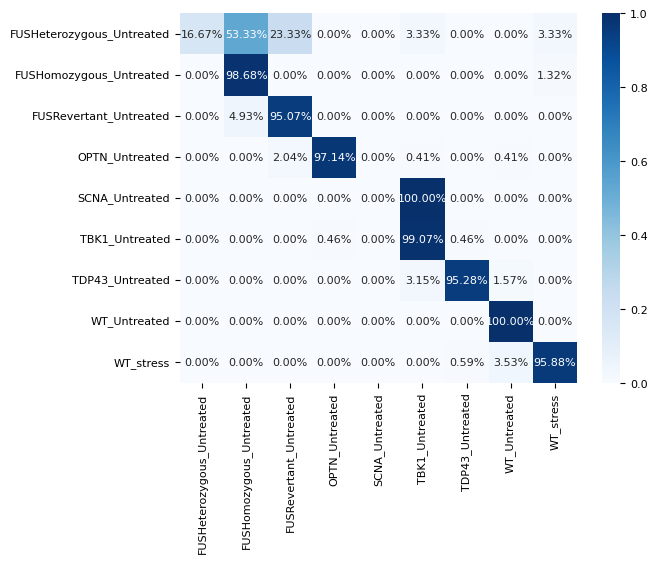


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  5  16   7   0   0   1   0   0   1]
 [  0  75   0   0   0   0   0   0   1]
 [  0   7 135   0   0   0   0   0   0]
 [  0   0   5 238   0   1   0   1   0]
 [  0   0   0   0   0   4   0   0   0]
 [  0   0   0   1   0 214   1   0   0]
 [  0   0   0   0   0   4 121   2   0]
 [  0   0   0   0   0   0   0 183   0]
 [  0   0   0   0   0   0   1   6 163]]
Sensitivity, hit rate, recall, or true positive rate: [0.16666667 0.98684211 0.95070423 0.97142857 0.         0.99074074
 0.95275591 1.         0.95882353]
Specificity or true negative rate: [1.         0.97940913 0.9885823  0.99894515 1.         0.98976459
 0.99812383 0.99108911 0.99804497]
Precision or positive predictive value: [1.         0.76530612 0.91836735 0.9958159         nan 0.95535714
 0.98373984 0.953125   0.98787879]
Negative predictive value: [0.97895623 0.99908676 0.99330784 0.99266247 0.99664711 0.99793602
 0.99439252 1.         0.99319066]
Fall out or false positive rate: [0.   

/tmp/ipykernel_75403/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_75403/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [117]:
fit_eval(mlp, X, y)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochas

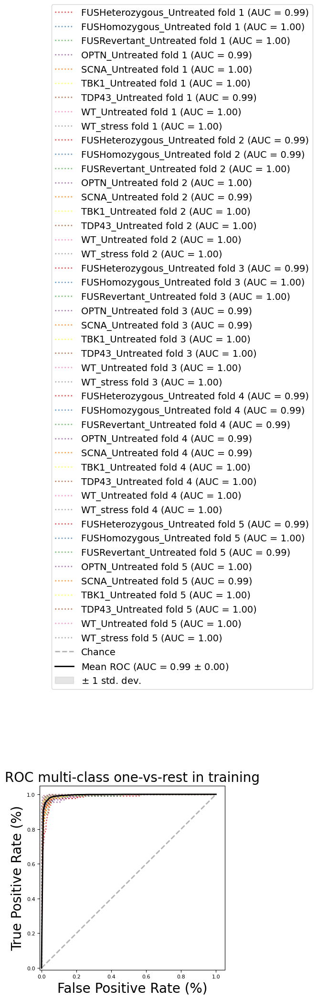



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98921032 0.99620072 0.99678127 0.98926354 0.9961751  0.99894017
 0.99444413 0.99739452 0.99779009 0.99231727 0.99364033 0.99578002
 0.99692264 0.99264993 0.99658467 0.99521915 0.99894392 0.99938445
 0.99415649 0.9967947  0.99625374 0.99328622 0.99393551 0.99510002
 0.99593986 0.99647856 0.99752127 0.99350298 0.99298631 0.9919886
 0.99184813 0.99409068 0.99820732 0.99809374 0.9964088  0.99796785
 0.98594589 0.9954385  0.99295795 0.99569275 0.99348941 0.9962294
 0.99877588 0.99905997 0.99936276] Mean: 0.9953145680213313


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Validating - Validate classifier

------------------

Balanced accuracy score: 0.9121423709663107. 
Balanced accuracy score (adjusted): 0.9011601673370996


One-vs-One ROC AUC scores:
0.994657 (macro),
0.994728 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.994861 (macro),
0.994921 (weighted by prevalence)


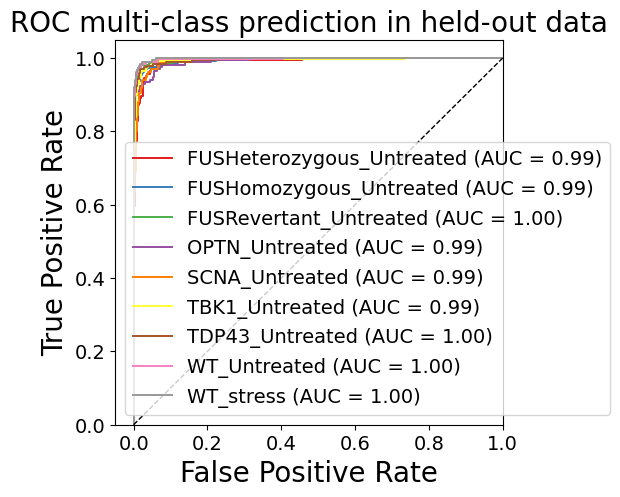

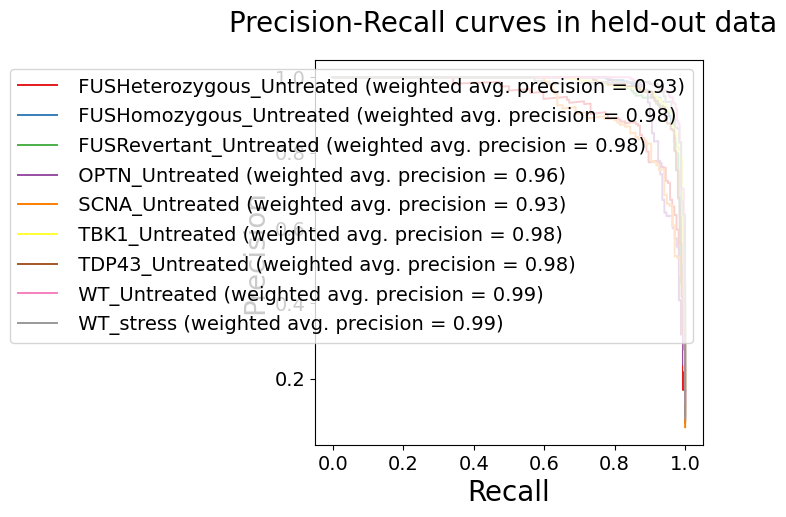

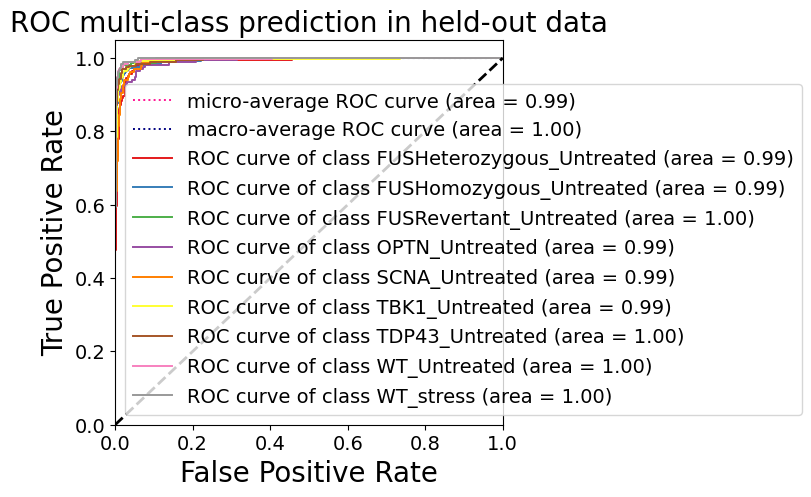


HELDOUT SET - AUC ROC scores of each class: {0: 0.9906390048445419, 1: 0.9944571798036794, 2: 0.9973599924467459, 3: 0.9924215292090415, 4: 0.9934267600934268, 5: 0.9940858159011816, 6: 0.9959147689916921, 7: 0.9970854026271238, 8: 0.9983599717568522, 'micro': 0.9947061423289276, 'macro': 0.9950325705324908}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.79      0.91      0.84       164
  FUSHomozygous_Untreated       0.93      0.89      0.91       321
   FUSRevertant_Untreated       0.95      0.88      0.91       157
           OPTN_Untreated       0.90      0.91      0.90       170
           SCNA_Untreated       0.77      0.91      0.84       135
           TBK1_Untreated       0.97      0.88      0.92       331
          TDP43_Untreated       0.94      0.93      0.94       195
             WT_Untreated       0.93      0.97      0.95       258
                WT_stress       0.94      0.9

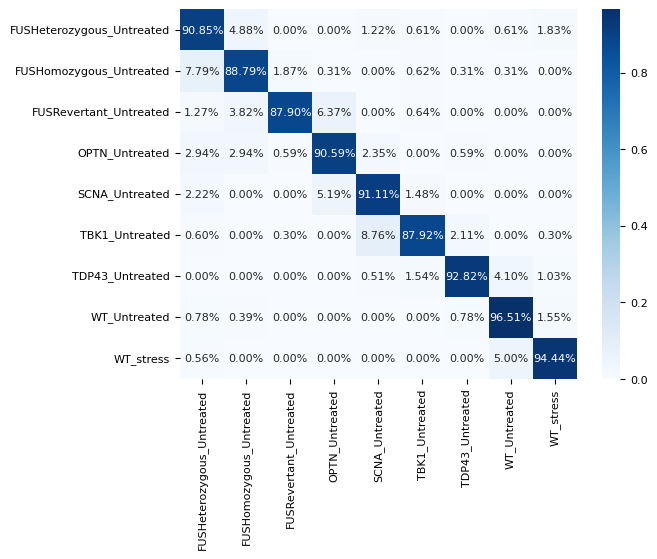


HELDOUT SET - One-vs-rest Confusion Matrix:
[[149   8   0   0   2   1   0   1   3]
 [ 25 285   6   1   0   2   1   1   0]
 [  2   6 138  10   0   1   0   0   0]
 [  5   5   1 154   4   0   1   0   0]
 [  3   0   0   7 123   2   0   0   0]
 [  2   0   1   0  29 291   7   0   1]
 [  0   0   0   0   1   3 181   8   2]
 [  2   1   0   0   0   0   2 249   4]
 [  1   0   0   0   0   0   0   9 170]]
Sensitivity, hit rate, recall, or true positive rate: [0.90853659 0.88785047 0.87898089 0.90588235 0.91111111 0.87915408
 0.92820513 0.96511628 0.94444444]
Specificity or true negative rate: [0.97710361 0.98742138 0.995439   0.98966111 0.97972973 0.9943038
 0.99358974 0.98850575 0.99422299]
Precision or positive predictive value: [0.78835979 0.93442623 0.94520548 0.89534884 0.77358491 0.97
 0.94270833 0.92910448 0.94444444]
Negative predictive value: [0.9912892  0.97758406 0.98923513 0.99079931 0.99315068 0.9751707
 0.99185573 0.99452222 0.99422299]
Fall out or false positive rate: [0.02289639 0.

In [74]:
fit_eval(mlp, X, y)

#### vqvec2

X_train shape (9233, 100), X_test shape: (2309, 100), y_train shape: (9233,), y_test shape: (2309,)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochas

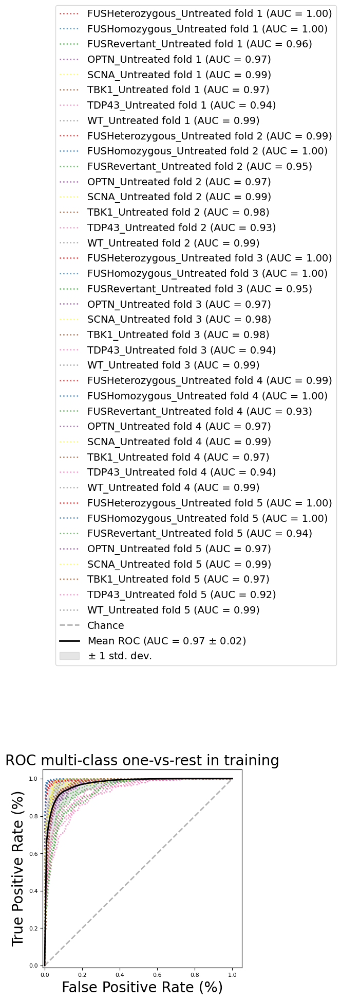



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.9973101  0.99731272 0.95719948 0.973832   0.98555191 0.9747806
 0.93641453 0.98562248 0.99440746 0.99689092 0.94679224 0.97146047
 0.99019608 0.97678924 0.9265338  0.98726919 0.99674684 0.99830518
 0.94560287 0.96563575 0.97831132 0.97531432 0.93601857 0.99022856
 0.99499189 0.99721697 0.93242665 0.97388402 0.98692308 0.97489102
 0.94028036 0.99017003 0.99560372 0.99848407 0.93597501 0.9712098
 0.99075487 0.97409302 0.91911264 0.98652564] Mean: 0.9736767359175504
Validating - Validate classifier

------------------

Balanced accuracy score: 0.8148455027315168. 
Balanced accuracy score (adjusted): 0.7883948602645906


One-vs-One ROC AUC scores:
0.976145 (macro),
0.977329 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.977439 (macro),
0.979294 (weighted by prevalence)


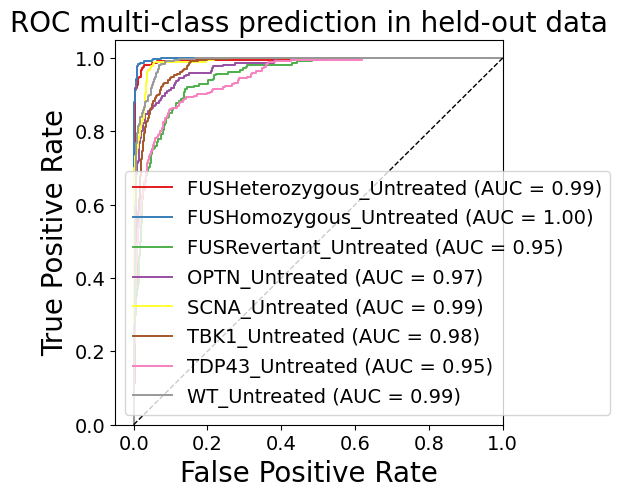

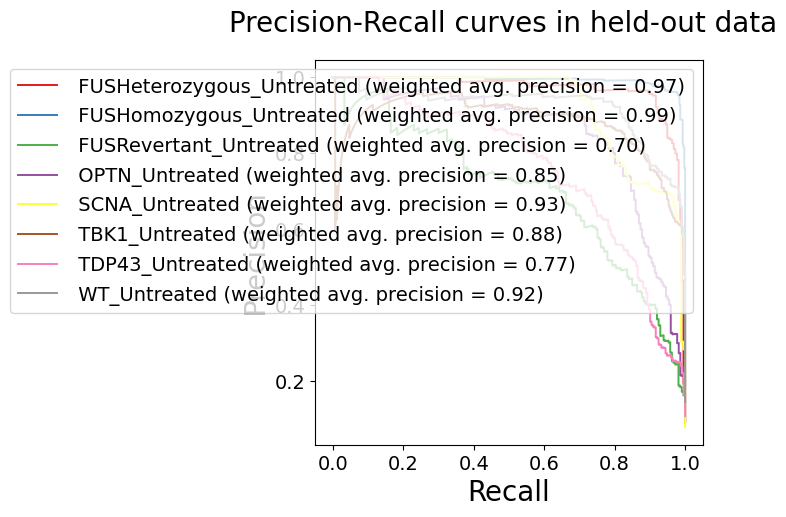

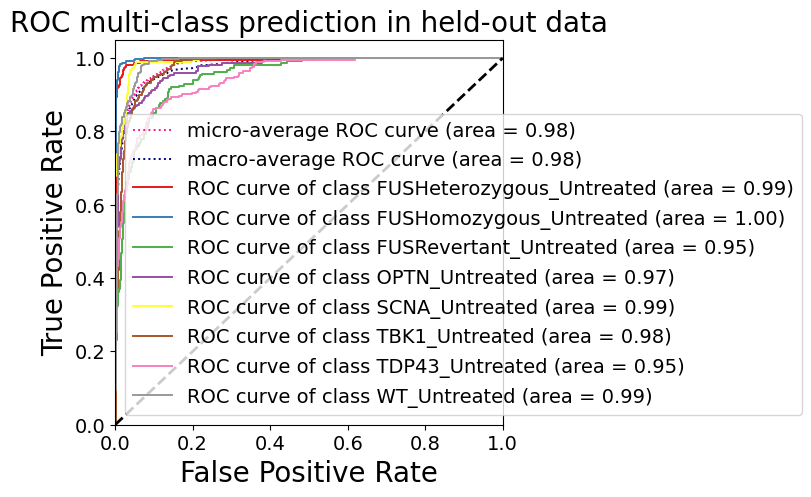


HELDOUT SET - AUC ROC scores of each class: {0: 0.9949335189574504, 1: 0.9982996440376304, 2: 0.9497634662939468, 3: 0.9737868622249962, 4: 0.9907416879795397, 5: 0.9766961228057571, 6: 0.9471973362347693, 7: 0.9880907127169164, 'micro': 0.9825074067465628, 'macro': 0.9776216663510567}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.96      0.84      0.90       217
  FUSHomozygous_Untreated       0.93      0.98      0.96       437
   FUSRevertant_Untreated       0.64      0.70      0.67       213
           OPTN_Untreated       0.82      0.80      0.81       221
           SCNA_Untreated       0.71      0.89      0.79       184
           TBK1_Untreated       0.87      0.80      0.83       449
          TDP43_Untreated       0.72      0.65      0.68       252
             WT_Untreated       0.86      0.85      0.85       336

                 accuracy                           0.83      2309


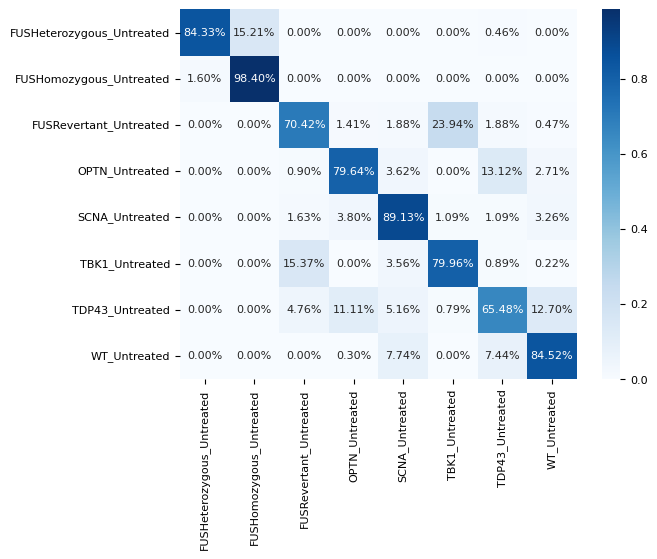


HELDOUT SET - One-vs-rest Confusion Matrix:
[[183  33   0   0   0   0   1   0]
 [  7 430   0   0   0   0   0   0]
 [  0   0 150   3   4  51   4   1]
 [  0   0   2 176   8   0  29   6]
 [  0   0   3   7 164   2   2   6]
 [  0   0  69   0  16 359   4   1]
 [  0   0  12  28  13   2 165  32]
 [  0   0   0   1  26   0  25 284]]
Sensitivity, hit rate, recall, or true positive rate: [0.84331797 0.98398169 0.70422535 0.79638009 0.89130435 0.79955457
 0.6547619  0.8452381 ]
Specificity or true negative rate: [0.99665392 0.98237179 0.95896947 0.98132184 0.96847059 0.97043011
 0.96840058 0.97668525]
Precision or positive predictive value: [0.96315789 0.9287257  0.63559322 0.81860465 0.70995671 0.86714976
 0.7173913  0.86060606]
Negative predictive value: [0.9839547  0.99620802 0.96960926 0.97851003 0.99037536 0.9525066
 0.95815296 0.9737241 ]
Fall out or false positive rate: [0.00334608 0.01762821 0.04103053 0.01867816 0.03152941 0.02956989
 0.03159942 0.02331475]
False negative rate: [0.1566820

In [70]:
fit_eval(mlp, X, y)

X_train shape (9233, 100), X_test shape: (2309, 100), y_train shape: (9233,), y_test shape: (2309,)


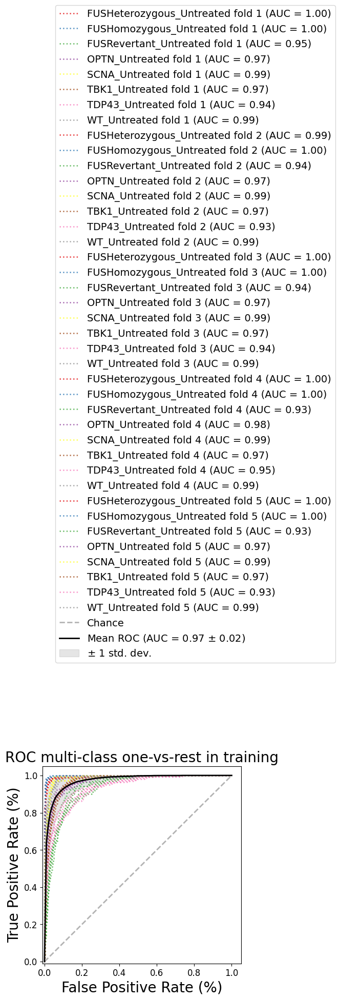



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99751728 0.99829564 0.9493809  0.97487736 0.98768353 0.97069593
 0.9420667  0.98653653 0.99465136 0.99702262 0.93562384 0.97348016
 0.98941577 0.97217667 0.93367005 0.98756838 0.99677433 0.99827846
 0.93527823 0.96731542 0.98520608 0.96963393 0.93728804 0.98977012
 0.9950022  0.9972342  0.92919767 0.97571197 0.98736752 0.97345425
 0.945443   0.99059906 0.99566903 0.99832329 0.92782184 0.97078666
 0.99024236 0.96943051 0.92914758 0.98703717] Mean: 0.9733168909873463
Validating - Validate classifier

------------------

Balanced accuracy score: 0.7882499562795198. 
Balanced accuracy score (adjusted): 0.7579999500337369


One-vs-One ROC AUC scores:
0.975743 (macro),
0.976554 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.976737 (macro),
0.978311 (weighted by prevalence)


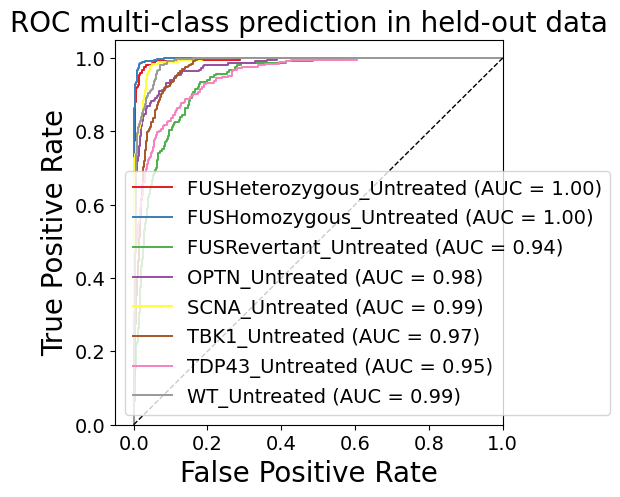

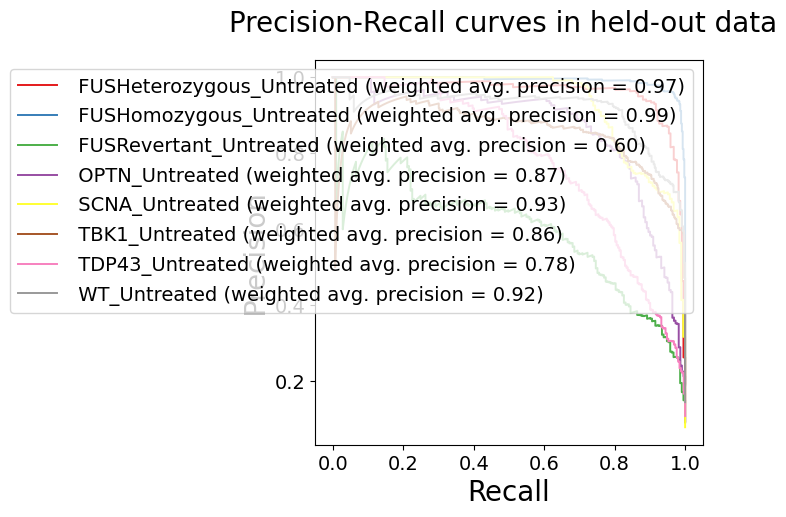

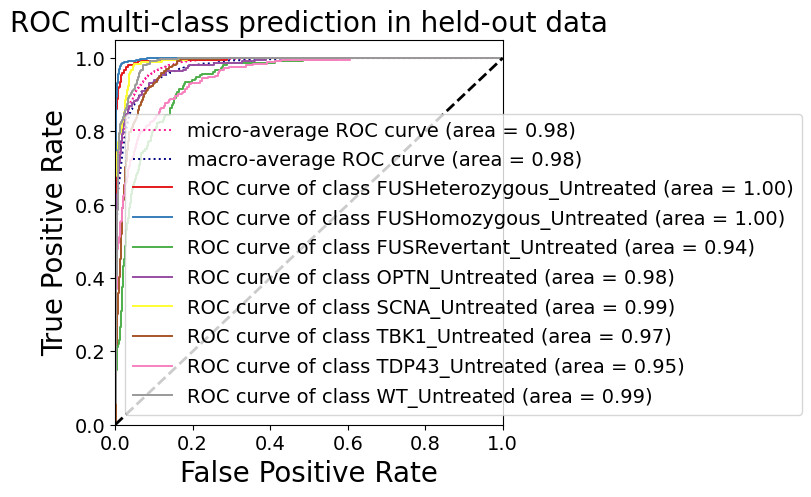


HELDOUT SET - AUC ROC scores of each class: {0: 0.9952727529055168, 1: 0.9981236186899802, 2: 0.9397555818370785, 3: 0.9777461382430956, 4: 0.9919616368286445, 5: 0.9717819766745694, 6: 0.9514877576374903, 7: 0.9877648854777593, 'micro': 0.9831397424360805, 'macro': 0.9769241813517082}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.93      0.91      0.92       217
  FUSHomozygous_Untreated       0.96      0.97      0.96       437
   FUSRevertant_Untreated       0.63      0.47      0.54       213
           OPTN_Untreated       0.81      0.79      0.80       221
           SCNA_Untreated       0.75      0.85      0.79       184
           TBK1_Untreated       0.78      0.85      0.81       449
          TDP43_Untreated       0.77      0.57      0.65       252
             WT_Untreated       0.77      0.90      0.83       336

                 accuracy                           0.81      2309


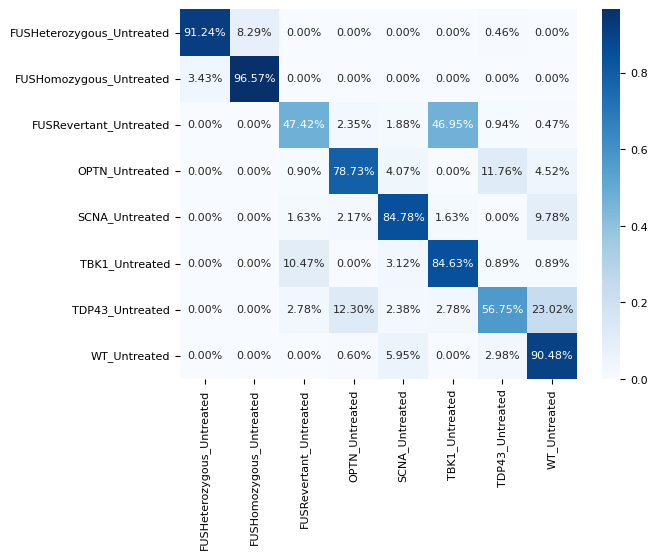


HELDOUT SET - One-vs-rest Confusion Matrix:
[[198  18   0   0   0   0   1   0]
 [ 15 422   0   0   0   0   0   0]
 [  0   0 101   5   4 100   2   1]
 [  0   0   2 174   9   0  26  10]
 [  0   0   3   4 156   3   0  18]
 [  0   0  47   0  14 380   4   4]
 [  0   0   7  31   6   7 143  58]
 [  0   0   0   2  20   0  10 304]]
Sensitivity, hit rate, recall, or true positive rate: [0.9124424  0.96567506 0.4741784  0.78733032 0.84782609 0.84632517
 0.56746032 0.9047619 ]
Specificity or true negative rate: [0.99282983 0.99038462 0.97185115 0.97988506 0.97505882 0.94086022
 0.97909577 0.95387734]
Precision or positive predictive value: [0.92957746 0.95909091 0.63125    0.80555556 0.74641148 0.7755102
 0.7688172  0.76962025]
Negative predictive value: [0.99093511 0.99197432 0.94788274 0.97754419 0.98666667 0.96206707
 0.94865756 0.98328109]
Fall out or false positive rate: [0.00717017 0.00961538 0.02814885 0.02011494 0.02494118 0.05913978
 0.02090423 0.04612266]
False negative rate: [0.0875576

In [33]:
fit_eval(mlp, X, y)

#### y shuffled

##### vqvec1

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


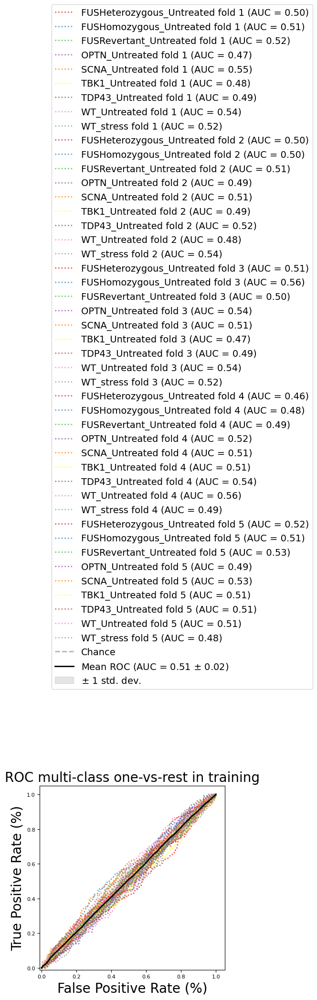



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.49871408 0.50798705 0.52262159 0.47400078 0.55125498 0.47806007
 0.48931546 0.53796034 0.52495989 0.49987168 0.49706336 0.50900282
 0.49005796 0.51032789 0.49329771 0.52042365 0.48076403 0.53964722
 0.50972268 0.5601276  0.50272559 0.53824903 0.50658171 0.47220305
 0.49047339 0.53651976 0.51778259 0.45720382 0.4790171  0.4878717
 0.51549547 0.50669162 0.50869    0.53575634 0.56062086 0.48696411
 0.51993913 0.51093229 0.52718175 0.48637367 0.53163489 0.50667623
 0.5050997  0.50675095 0.48165794] Mean: 0.5083171899335437
Validating - Validate classifier

------------------

Balanced accuracy score: 0.10670189892360825. 
Balanced accuracy score (adjusted): -0.004960363710940713


One-vs-One ROC AUC scores:
0.486893 (macro),
0.487081 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.486943 (macro),
0.487584 (weighted by prevalence)


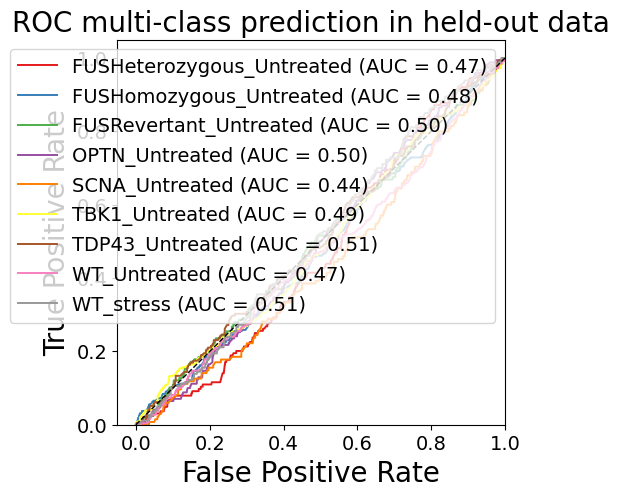

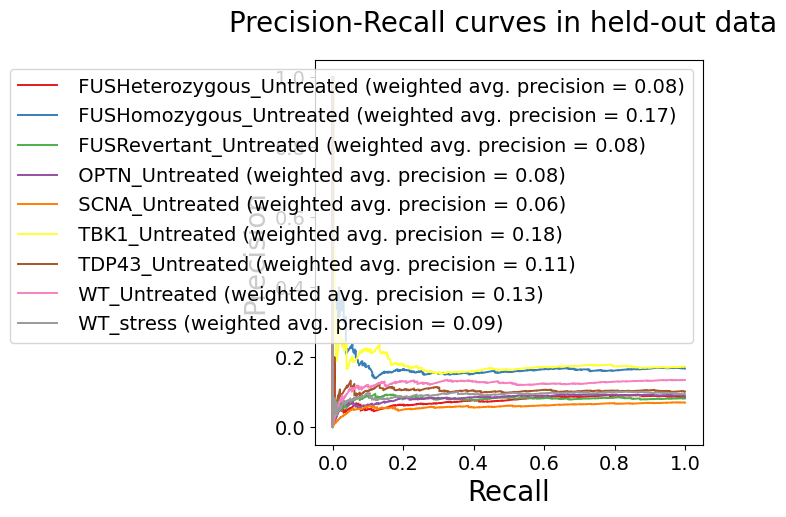

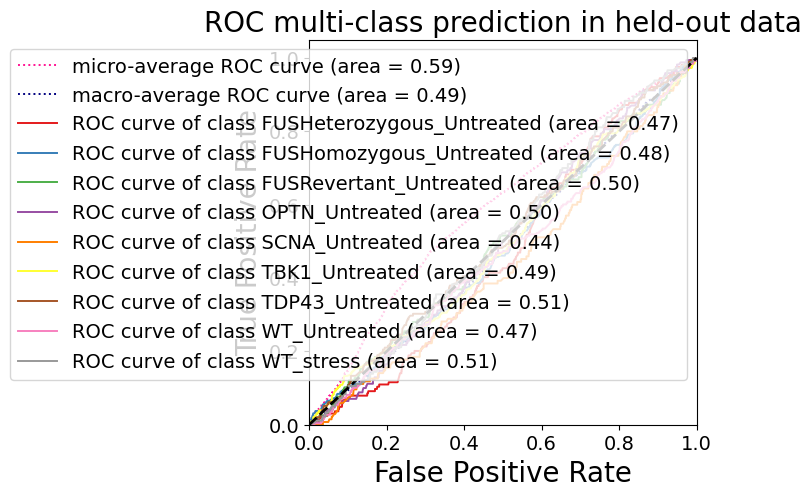


HELDOUT SET - AUC ROC scores of each class: {0: 0.4743916400240133, 1: 0.48264268500558394, 2: 0.4998946902076419, 3: 0.49925668142041424, 4: 0.4405009175842509, 5: 0.49324543959616046, 6: 0.5091312533620225, 7: 0.4699805849829063, 8: 0.5134443802554721, 'micro': 0.5930532862019742, 'macro': 0.4869849085361493}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00       164
  FUSHomozygous_Untreated       0.16      0.43      0.23       321
   FUSRevertant_Untreated       0.00      0.00      0.00       157
           OPTN_Untreated       0.00      0.00      0.00       170
           SCNA_Untreated       0.00      0.00      0.00       135
           TBK1_Untreated       0.17      0.52      0.26       331
          TDP43_Untreated       0.00      0.00      0.00       195
             WT_Untreated       0.07      0.01      0.01       258
                WT_stress       0.00      

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

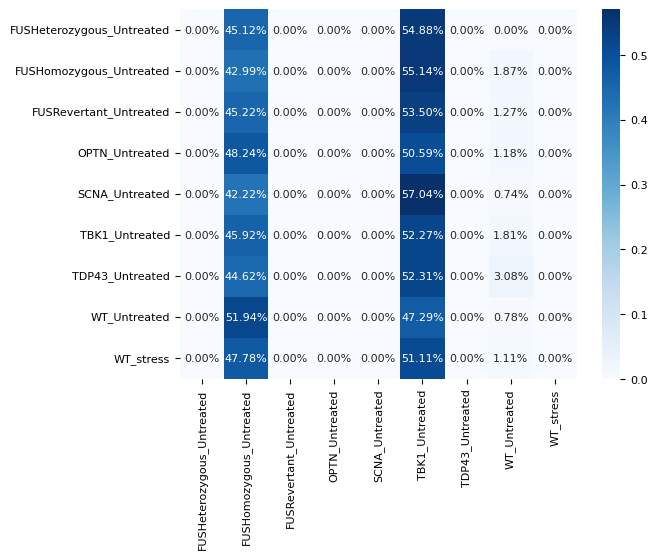


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0  74   0   0   0  90   0   0   0]
 [  0 138   0   0   0 177   0   6   0]
 [  0  71   0   0   0  84   0   2   0]
 [  0  82   0   0   0  86   0   2   0]
 [  0  57   0   0   0  77   0   1   0]
 [  0 152   0   0   0 173   0   6   0]
 [  0  87   0   0   0 102   0   6   0]
 [  0 134   0   0   0 122   0   2   0]
 [  0  86   0   0   0  92   0   2   0]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.42990654 0.         0.         0.         0.52265861
 0.         0.00775194 0.        ]
Specificity or true negative rate: [1.         0.5327044  1.         1.         1.         0.47468354
 1.         0.98487598 1.        ]
Precision or positive predictive value: [       nan 0.15664018        nan        nan        nan 0.17248255
        nan 0.07407407        nan]
Negative predictive value: [0.91418106 0.8223301  0.91784406 0.91104134 0.92935636 0.82599119
 0.89795918 0.8641189  0.90580848]
Fall out or false positive rate: [0.   

/tmp/ipykernel_75403/4056820779.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_75403/4056820779.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [76]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(rfc, X, y_shuffled)

##### vqvec2

X_train shape (9233, 100), X_test shape: (2309, 100), y_train shape: (9233,), y_test shape: (2309,)


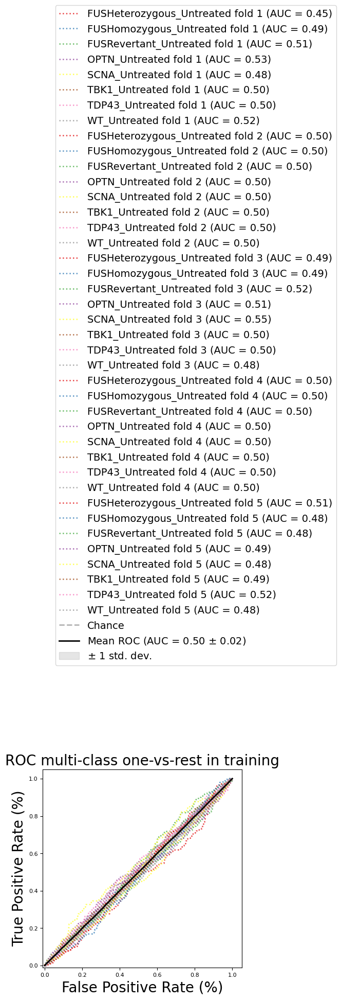



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.45215848 0.48669434 0.51483567 0.52587029 0.48116937 0.5006917
 0.50249814 0.51985832 0.5        0.5        0.5        0.5
 0.5        0.5        0.5        0.5        0.49413264 0.49349556
 0.51705013 0.50532176 0.55343337 0.49973268 0.5043419  0.47529964
 0.5        0.5        0.5        0.5        0.5        0.5
 0.5        0.5        0.50622319 0.47947279 0.48153517 0.49240216
 0.47960985 0.4899388  0.52410591 0.48146686] Mean: 0.49903346853688096
Validating - Validate classifier

------------------

Balanced accuracy score: 0.12461457701579406. 
Balanced accuracy score (adjusted): -0.000440483410521069


One-vs-One ROC AUC scores:
0.492685 (macro),
0.492585 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.492884 (macro),
0.492701 (weighted by prevalence)


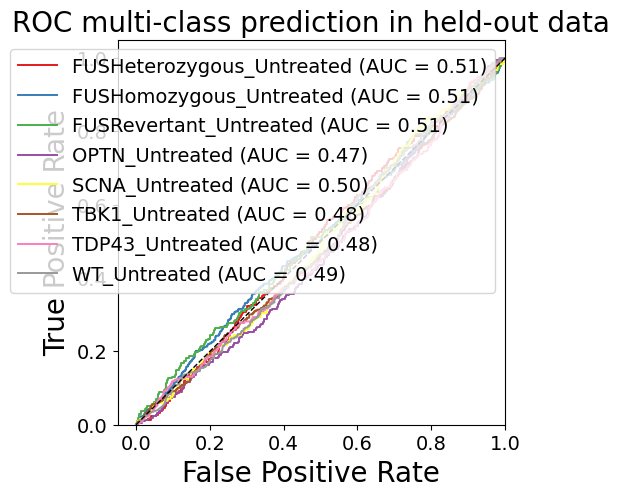

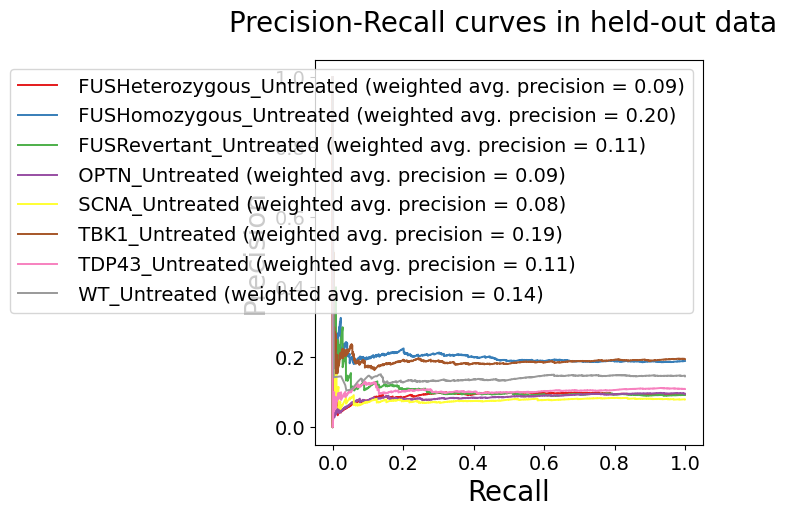

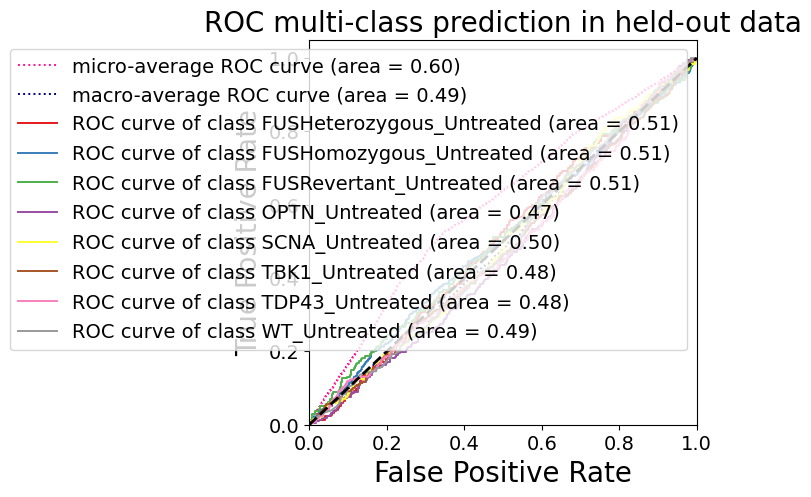


HELDOUT SET - AUC ROC scores of each class: {0: 0.5057427461208378, 1: 0.5086979747305833, 2: 0.513929953768412, 3: 0.4694613477574938, 4: 0.4950179028132992, 5: 0.4805254208875158, 6: 0.479466166631942, 7: 0.4902297082036058, 'micro': 0.5989146221418454, 'macro': 0.4930885803680915}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00       217
  FUSHomozygous_Untreated       0.19      0.97      0.31       437
   FUSRevertant_Untreated       0.00      0.00      0.00       213
           OPTN_Untreated       0.00      0.00      0.00       221
           SCNA_Untreated       0.00      0.00      0.00       184
           TBK1_Untreated       0.22      0.03      0.05       449
          TDP43_Untreated       0.00      0.00      0.00       252
             WT_Untreated       0.00      0.00      0.00       336

                 accuracy                           0.19      2309
  

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

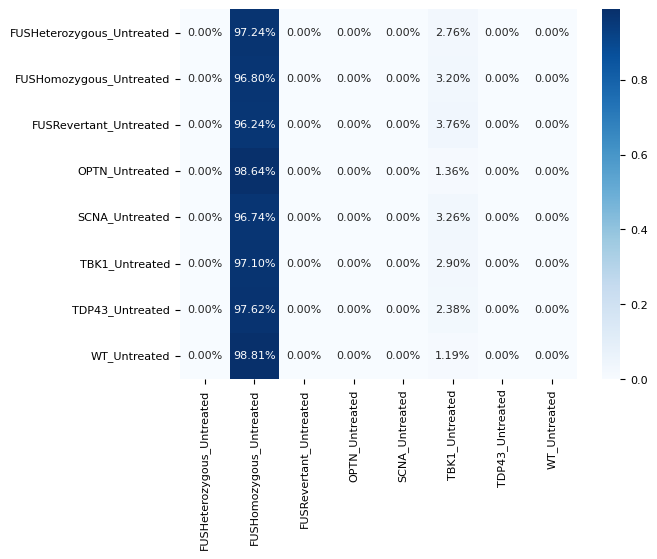


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0 211   0   0   0   6   0   0]
 [  0 423   0   0   0  14   0   0]
 [  0 205   0   0   0   8   0   0]
 [  0 218   0   0   0   3   0   0]
 [  0 178   0   0   0   6   0   0]
 [  0 436   0   0   0  13   0   0]
 [  0 246   0   0   0   6   0   0]
 [  0 332   0   0   0   4   0   0]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.96796339 0.         0.         0.         0.02895323
 0.         0.        ]
Specificity or true negative rate: [1.         0.02457265 1.         1.         1.         0.97473118
 1.         1.        ]
Precision or positive predictive value: [       nan 0.18808359        nan        nan        nan 0.21666667
        nan        nan]
Negative predictive value: [0.90601992 0.76666667 0.90775227 0.90428757 0.92031182 0.80613606
 0.89086184 0.85448246]
Fall out or false positive rate: [0.         0.97542735 0.         0.         0.         0.02526882
 0.         0.        ]
False negative rate: [1.      

/tmp/ipykernel_75403/4056820779.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_75403/4056820779.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [37]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(mlp, X, y_shuffled)

---------------------

# Old

In [ ]:
# from sklearn.model_selection import StratifiedKFold

# clf = mlp
# unique_labels = np.unique(y)

# skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
# result = fit_and_plot_multiclass_cv_auc_roc_curves(clf, skf, X_train, y_train,
#                                                     n_classes=len(unique_labels),
#                                                     class_names=unique_labels,
#                                                     colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
#                                                     title='ROC multi-class one-vs-rest in training')

# print("\n\nTraining dataset (75%): K-Fold Cross Validation score: " + str(model_scorer) + " " + str(
#     result) + " Mean: " + str(result.mean()))


In [ ]:


# clf_trained = clf.fit(X_train, y_train)
# validate_classifier(clf_trained, X_test, y_test, 'roc_auc_ovr_weighted',
#                     unique_labels, sample_weight=None, colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
#                     title='Validate classifier', show_plot=True)

-----------------------

# Plot

2023-08-27 21:00:40 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 21:00:40 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 21:00:40 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same

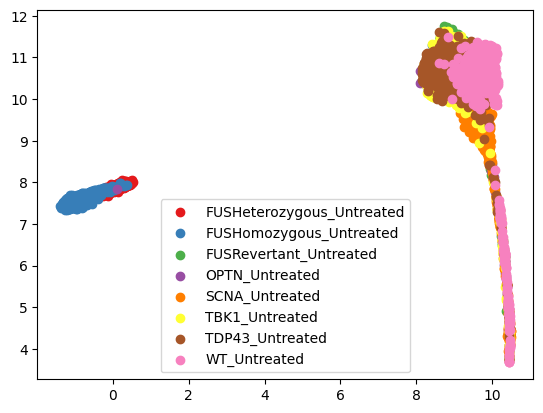

In [22]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

2023-08-27 20:44:51 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 20:44:51 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 20:44:51 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same

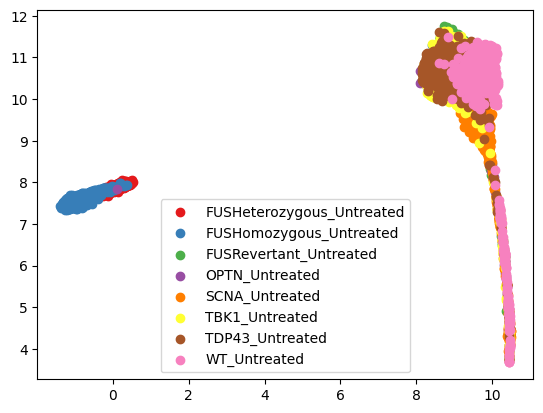

In [114]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

2023-08-27 16:08:57 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:08:57 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:08:57 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same

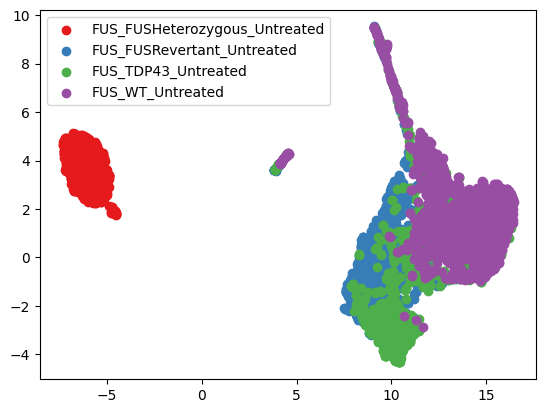

In [63]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

2023-08-27 16:11:41 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:11:41 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:11:41 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same

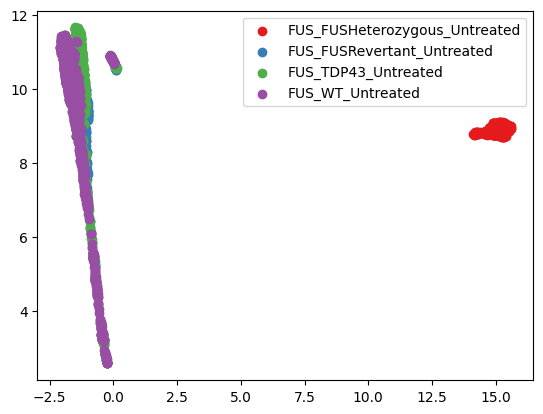

In [70]:
# 50 umaps
groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

2023-08-27 16:50:39 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:50:39 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
2023-08-27 16:50:39 WARNING *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same

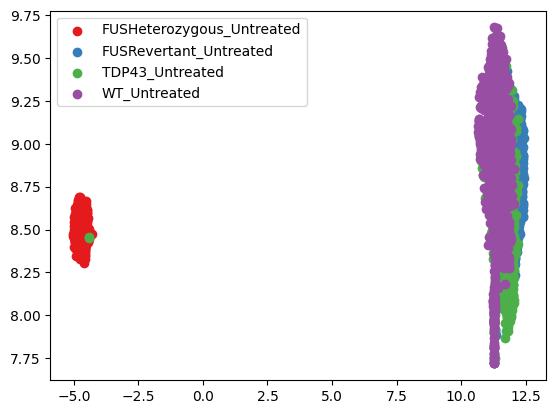

In [97]:
# 50 umaps multi
groups = np.unique(label_data.reshape(-1,))
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(label_data.reshape(-1,) == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

# Models

In [8]:
from sklearn.model_selection import train_test_split
labels_flat = label_data.reshape(-1,)
X_train, X_test, y_train, y_test = train_test_split(x, labels_flat, test_size=.2, stratify=labels_flat, random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(9233, 100) (2309, 100) (9233,) (2309,)


In [9]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
mlp.fit(X_train, y_train)

MLPClassifier(hidden_layer_sizes=(50,), random_state=1)

In [10]:
mlp.n_layers_

3

In [47]:
# for i in range(5):
#     print(mlp.predict(X_test[[i]]), y_test[i])

['FUS_FUSRevertant_Untreated'] FUS_WT_Untreated
['FUS_FUSRevertant_Untreated'] FUS_FUSRevertant_Untreated
['FUS_FUSRevertant_Untreated'] FUS_FUSRevertant_Untreated
['FUS_FUSRevertant_Untreated'] FUS_TDP43_Untreated
['FUS_FUSHeterozygous_Untreated'] FUS_FUSHeterozygous_Untreated


In [11]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=20, max_depth=3, random_state=1)
rfc.fit(X_train, y_train)

RandomForestClassifier(max_depth=3, n_estimators=20, random_state=1)

### Plots

In [12]:

    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


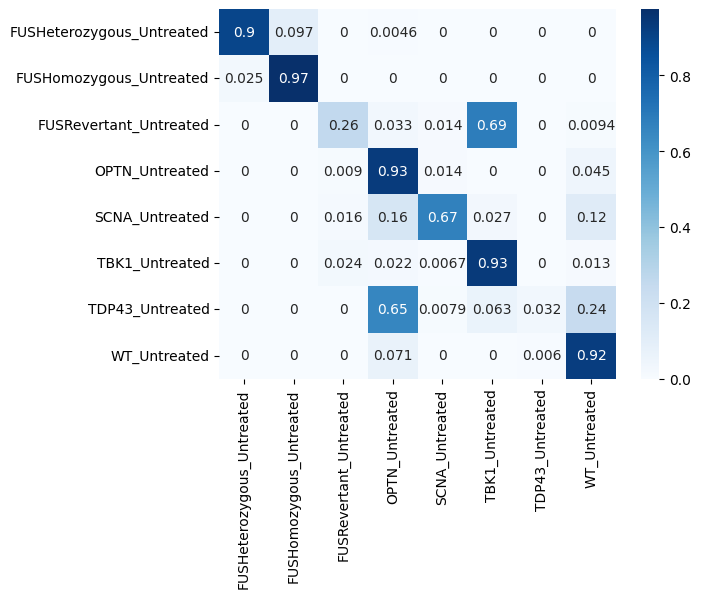

In [15]:
plot_conf_matrix(rfc, 'true')

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


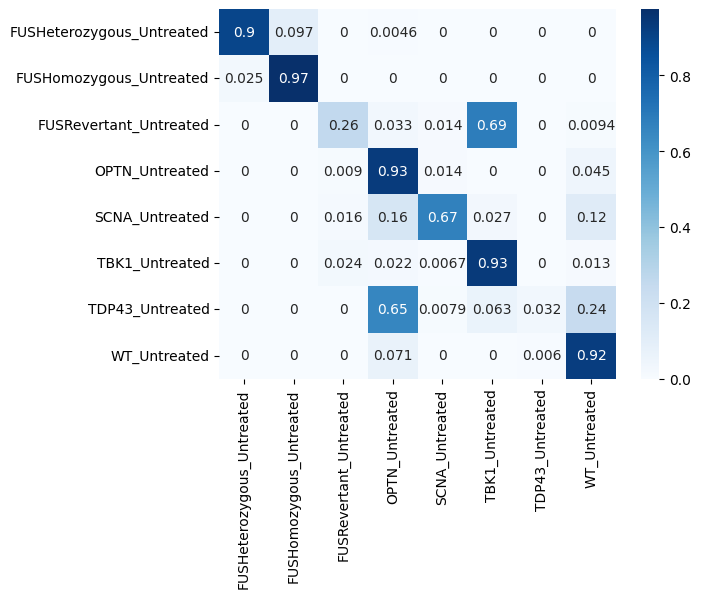

In [40]:
plot_conf_matrix(rfc, 'true')

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated' 'WT_stress']


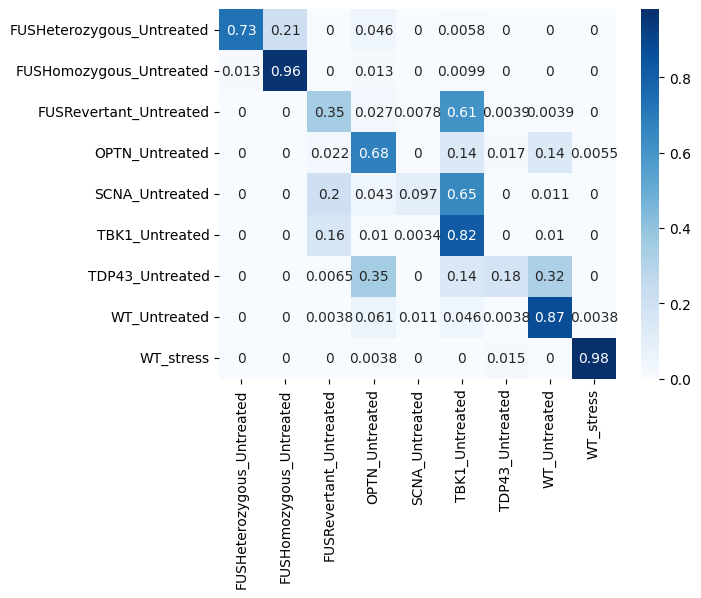

In [32]:
plot_conf_matrix(mlp, 'true')

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated' 'WT_stress']


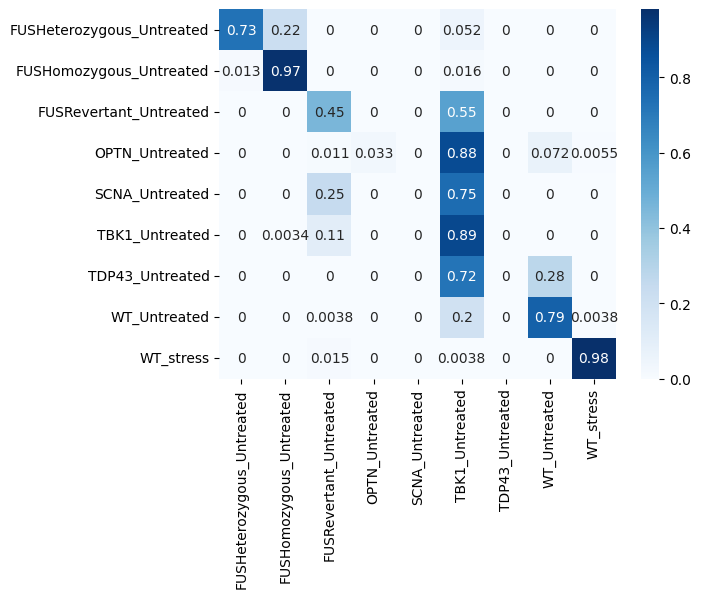

In [33]:
plot_conf_matrix(rfc, 'true')

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


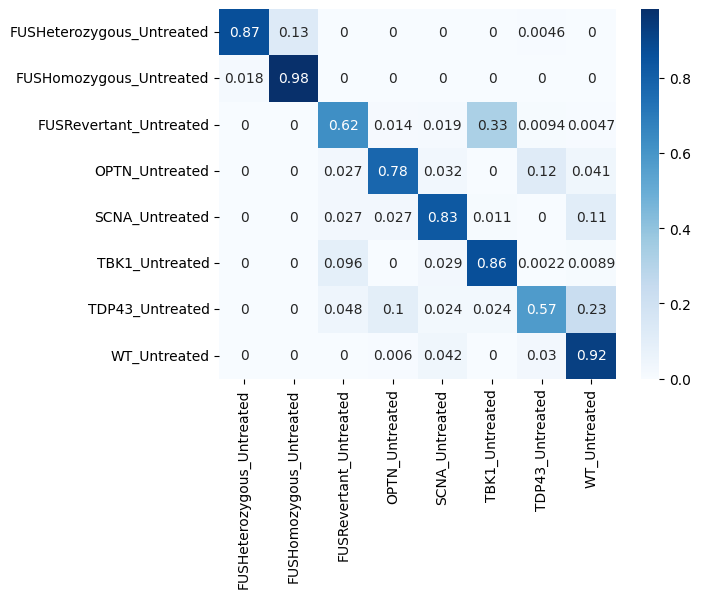

In [80]:
plot_conf_matrix(mlp, 'true')

### Utils

### Reports

In [95]:
def cv_report(get_clf, x, labels_flat):
    from sklearn.metrics import classification_report
    from sklearn.model_selection import StratifiedKFold

    skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    for i, (train_index, test_index) in enumerate(skf.split(x, labels_flat)):
        print(i)
        print(train_index[:2], test_index[:2])
        x_train, y_train = x[train_index], labels_flat[train_index]
        x_test, y_test = x[test_index], labels_flat[test_index]

        print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

        clf = get_clf() #MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
        clf.fit(x_train, y_train)

        predictions = clf.predict(x_test)
        print(classification_report(y_test, predictions))
        
        

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
fit_and_plot_multiclass_cv_auc_roc_curves(mlp, skf, x, labels_flat)

In [96]:
cv_report(lambda : MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1), x, labels_flat)

0
[0 2] [1 5]
(9233, 100) (9233,) (2309, 100) (2309,)
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.99      0.76      0.86       218
  FUSHomozygous_Untreated       0.89      1.00      0.94       437
   FUSRevertant_Untreated       0.72      0.16      0.26       212
           OPTN_Untreated       0.84      0.68      0.75       222
           SCNA_Untreated       0.79      0.79      0.79       184
           TBK1_Untreated       0.65      0.96      0.78       448
          TDP43_Untreated       0.68      0.63      0.65       252
             WT_Untreated       0.83      0.86      0.85       336

                 accuracy                           0.78      2309
                macro avg       0.80      0.73      0.74      2309
             weighted avg       0.79      0.78      0.76      2309

1
[0 1] [3 4]
(9233, 100) (9233,) (2309, 100) (2309,)
                           precision    recall  f1-score   support

FUSHeterozygous_U

In [91]:
# from sklearn.metrics import classification_report
# from sklearn.model_selection import StratifiedKFold

# skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
# for i, (train_index, test_index) in enumerate(skf.split(x, labels_flat)):
#     print(i)
#     print(train_index[:2], test_index[:2])
#     x_train, y_train = x[train_index], labels_flat[train_index]
#     x_test, y_test = x[test_index], labels_flat[test_index]

#     print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

#     mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
#     mlp.fit(x_train, y_train)

#     predictions = mlp.predict(x_test)
#     print(classification_report(y_test, predictions))

### 2 UMAPS

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


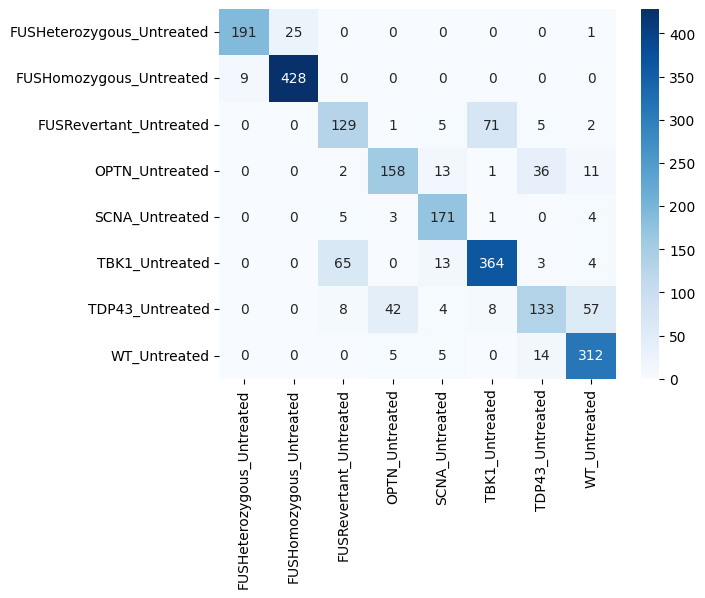

In [40]:
plot_conf_matrix(mlp)

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


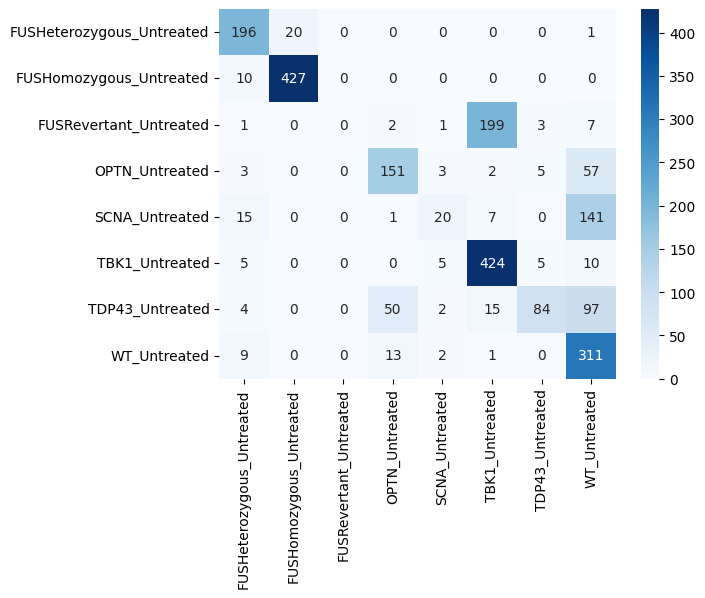

In [41]:
plot_conf_matrix(rfc)

### 100 UMAPS

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


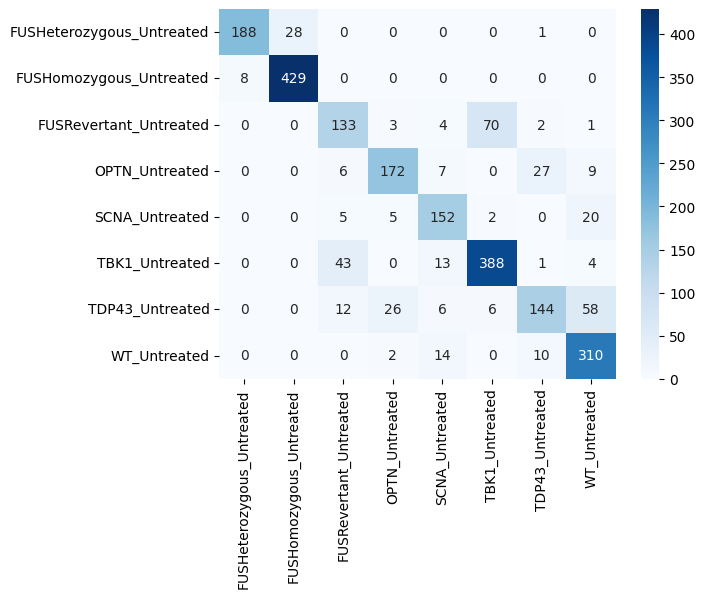

In [30]:
plot_conf_matrix(mlp)

['FUSHeterozygous_Untreated' 'FUSHomozygous_Untreated'
 'FUSRevertant_Untreated' 'OPTN_Untreated' 'SCNA_Untreated'
 'TBK1_Untreated' 'TDP43_Untreated' 'WT_Untreated']


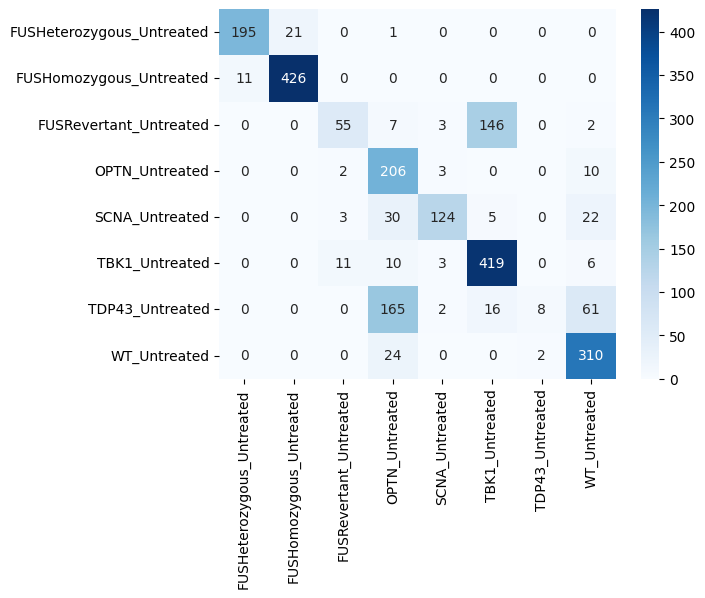

In [32]:
plot_conf_matrix(rfc)

# PLOTS old

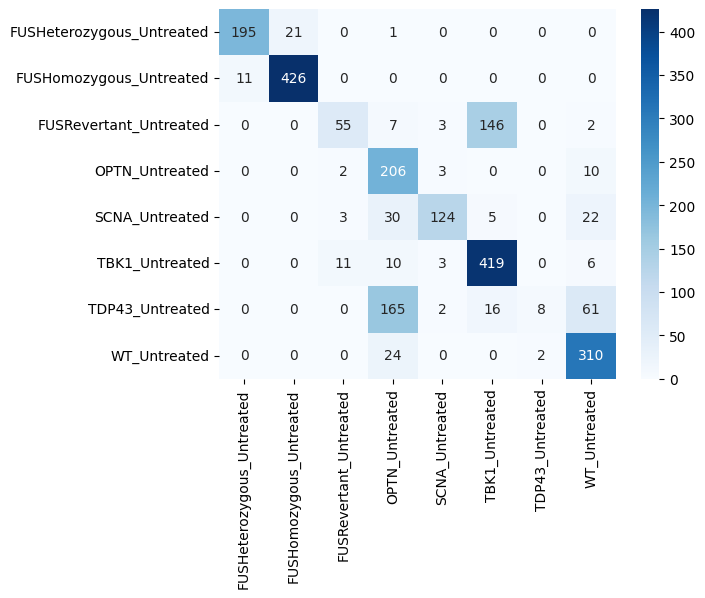

In [18]:
plot_conf_matrix(rfc)

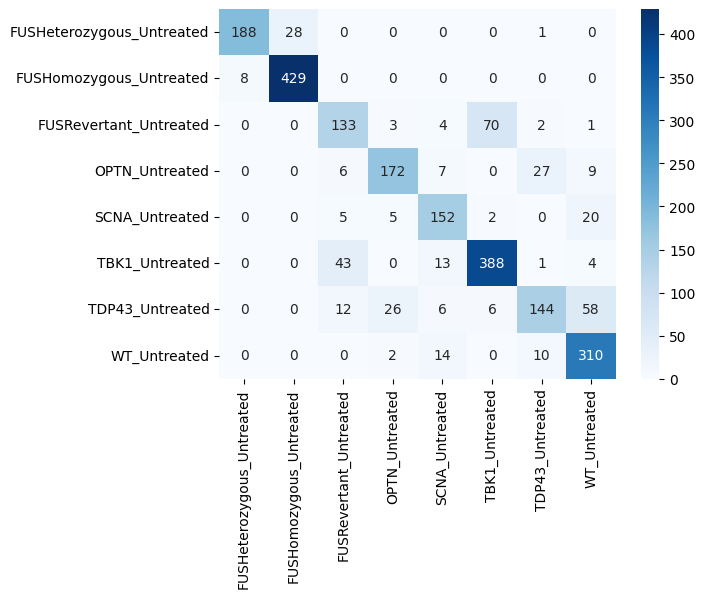

In [19]:
plot_conf_matrix(mlp)

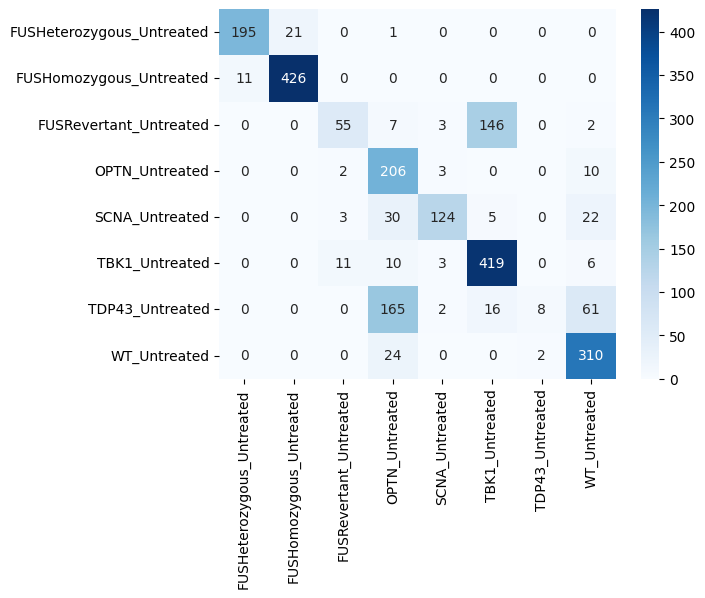

In [116]:
plot_conf_matrix(rfc)

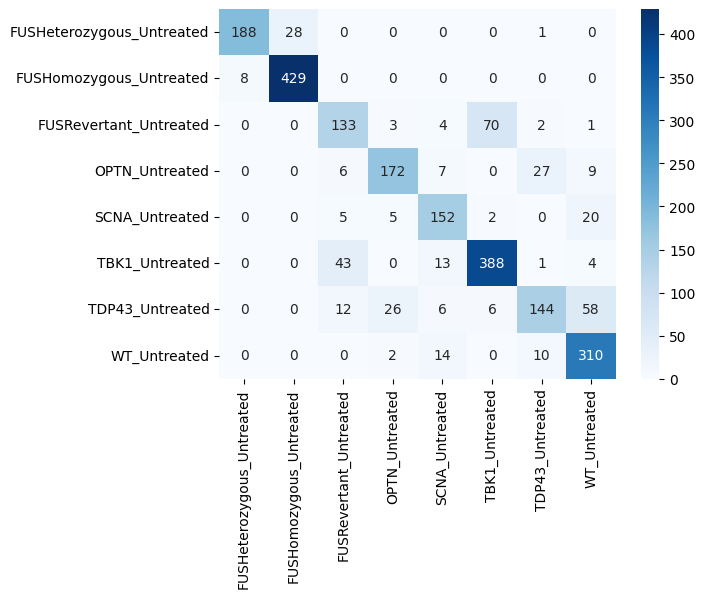

In [119]:
plot_conf_matrix(mlp)

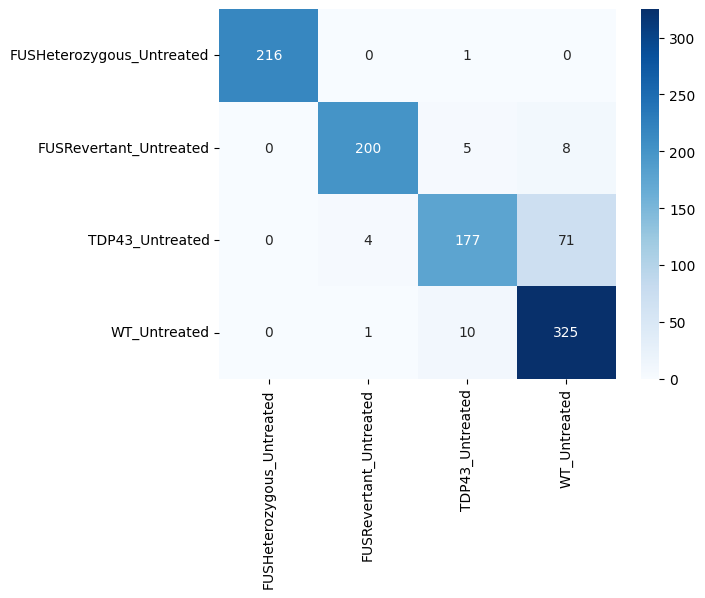

In [99]:
plot_conf_matrix(rfc)

In [28]:
# def plot_conf_matrix(clf):
#     from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

#     unique_labels = np.unique(mlp.classes_)

#     predictions = clf.predict(X_test)
#     conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

#     import seaborn as sns

#     sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
#     plt.show()
#     # for i, l in enumerate(unique_labels):
#     #     print(l)
#     #     disp = ConfusionMatrixDisplay(conf_matrix[i])
#     #     disp.plot()
#     #     plt.show()
    
# # plot_conf_matrix(rfc)

AttributeError: 'MLPClassifier' object has no attribute 'classes_'

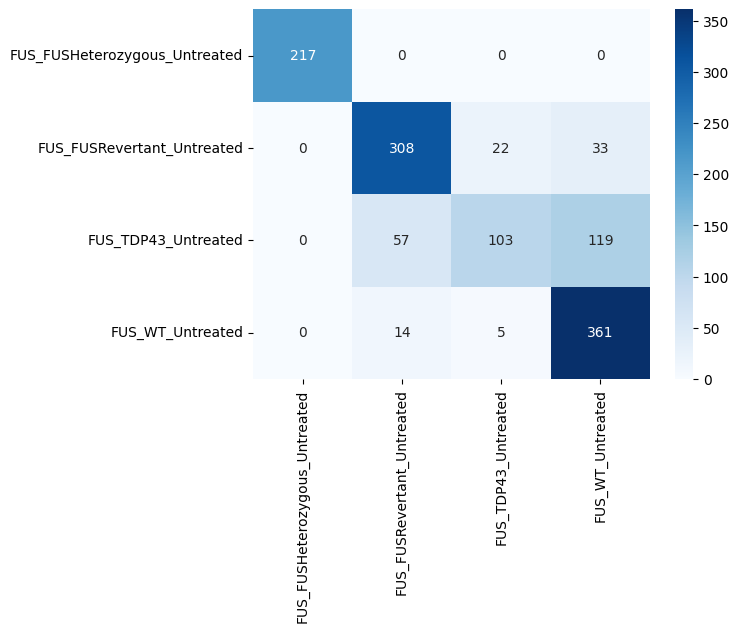

In [74]:
#50 umaps
def plot_conf_matrix(clf):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(mlp.classes_)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

    import seaborn as sns

    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()
    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()
    
plot_conf_matrix(rfc)

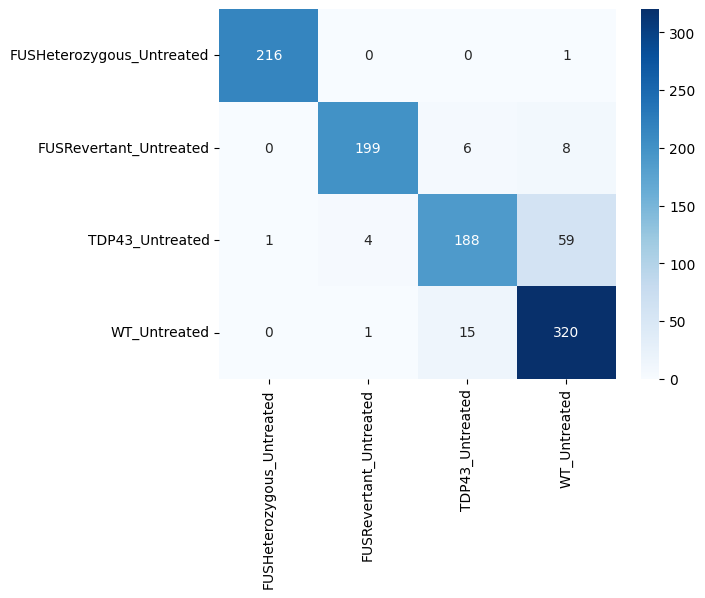

In [95]:
#Multiplex

def plot_conf_matrix(clf):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(mlp.classes_)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

    import seaborn as sns

    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()
    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()
    
plot_conf_matrix(rfc)

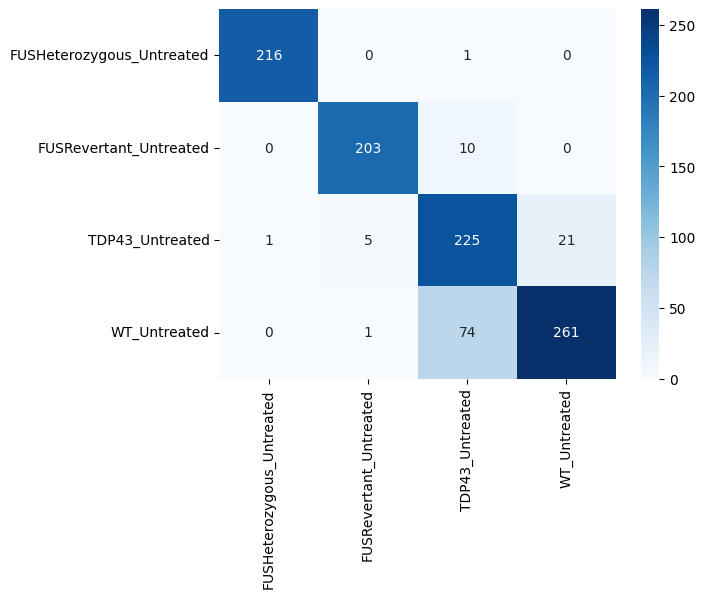

In [96]:
#multi 50umaps
plot_conf_matrix(mlp)

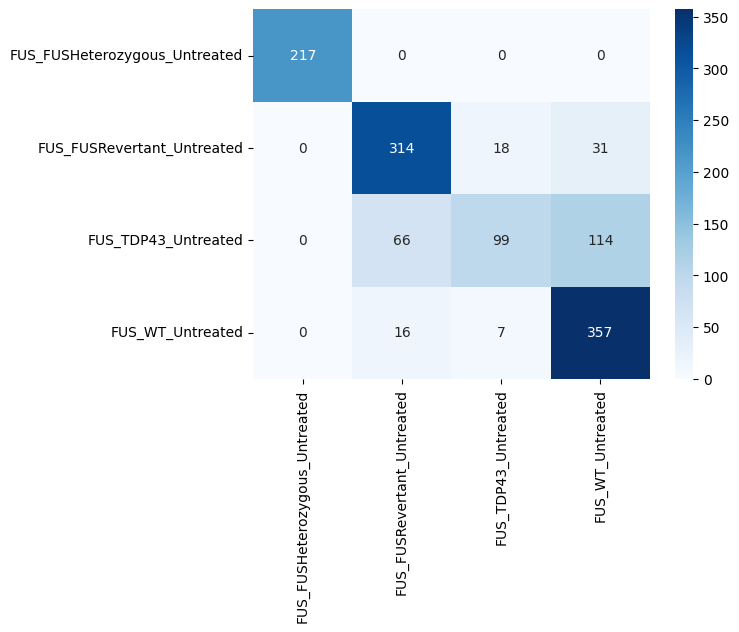

In [68]:
plot_conf_matrix(mlp)

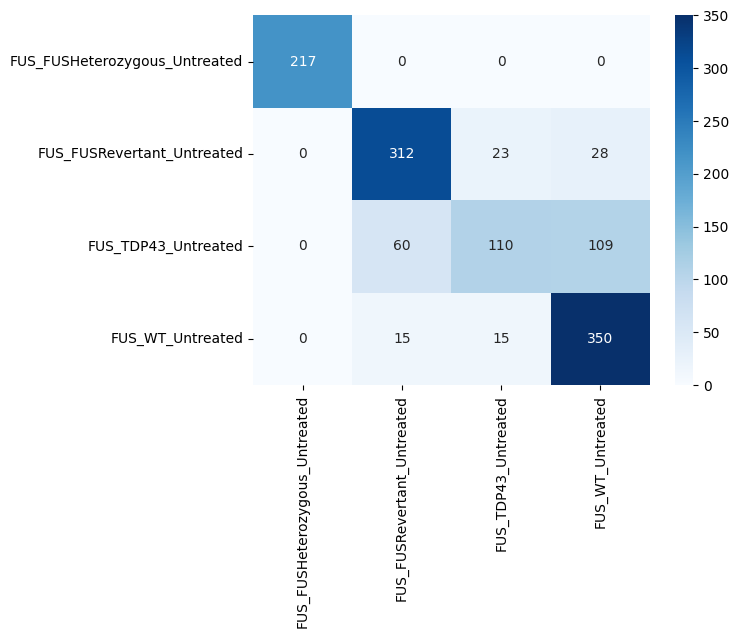

In [75]:
#50umaps
plot_conf_matrix(mlp)

In [41]:
from xgboost import XGBClassifier

# create model instance
bst = XGBClassifier(n_estimators=20, max_depth=4, learning_rate=0.1, objective='multi:softmax')
# fit model
bst.fit(X_train, y_train)
# # make predictions
# preds = bst.predict(X_test)

(4953, 2) (1239, 2) (4953, 1) (1239, 1)


/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/xgboost/sklearn.py:1438: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  or not (self.classes_ == expected_classes).all()


AttributeError: 'bool' object has no attribute 'all'